# Capstone Project

### Problem Statement

A retail store that has multiple outlets across the country are facing issues in managing the
inventory - to match the demand with respect to supply. You are a data scientist, who has to
come up with useful insights using the data and make prediction models to forecast the sales for
X number of months/years.


#### Dataset Information:
The `walmart.csv` file contains **6435 rows and 8 columns**.

| Feature Name   | Description                                |
|----------------|--------------------------------------------|
| Store          | Store number                              |
| Date           | Week of Sales                             |
| Weekly_Sales   | Sales for the given store in that week    |
| Holiday_Flag   | If it is a holiday week                   |
| Temperature    | Temperature on the day of the sale        |
| Fuel_Price     | Cost of the fuel in the region            |
| CPI            | Consumer Price Index                      |
| Unemployment   | Unemployment Rate                         |

---

1. Using the above data, come up with useful insights that can be used by each of
the stores to improve in various areas.
2. Forecast the sales for each store for the next 12 weeks.


In [1]:
# Importing the Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Importing the Dataset

df= pd.read_csv('Walmart.csv')

In [3]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


## Performing EDA

In [4]:
df.shape

(6435, 8)

In [5]:
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [7]:
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [8]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
df['Store'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [11]:
df['Store'].nunique()

45

In [12]:
df['Holiday_Flag'].unique()

array([0, 1], dtype=int64)

In [13]:
df['Holiday_Flag'].nunique()

2

In [14]:
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

df['Day_of_Week'] = df['Date'].dt.dayofweek
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

In [15]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Day_of_Week,Month,Year
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,4,2,2010
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,4,2,2010
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,4,2,2010
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,4,2,2010
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,4,3,2010


In [16]:
total_sales_by_store = df.groupby('Store')['Weekly_Sales'].sum().reset_index()

In [17]:
df.corr()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Day_of_Week,Month,Year
Store,1.000000e+00,1.577299e-13,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531,NaN,2.910676e-15,3.474318e-12
Date,1.577299e-13,1.000000e+00,0.006949,-1.328524e-02,0.145357,0.771444,0.077157,-0.248203,NaN,1.456512e-01,9.416680e-01
Weekly_Sales,-3.353320e-01,6.949360e-03,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176,NaN,7.614332e-02,-1.837754e-02
Holiday_Flag,-4.386841e-16,-1.328524e-02,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960,NaN,1.229958e-01,-5.678257e-02
Temperature,-2.265908e-02,1.453566e-01,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158,NaN,2.358618e-01,6.426923e-02
Fuel_Price,6.002295e-02,7.714439e-01,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684,NaN,-4.215590e-02,7.794703e-01
CPI,-2.094919e-01,7.715746e-02,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020,NaN,4.979672e-03,7.479573e-02
Unemployment,2.235313e-01,-2.482029e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000,NaN,-1.274559e-02,-2.418135e-01
Day_of_Week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Month,2.910676e-15,1.456512e-01,0.076143,1.229958e-01,0.235862,-0.042156,0.004980,-0.012746,NaN,1.000000e+00,-1.944645e-01


#### Visualization

Text(0.5, 1.0, 'Total Weekly Sales Of Stores')

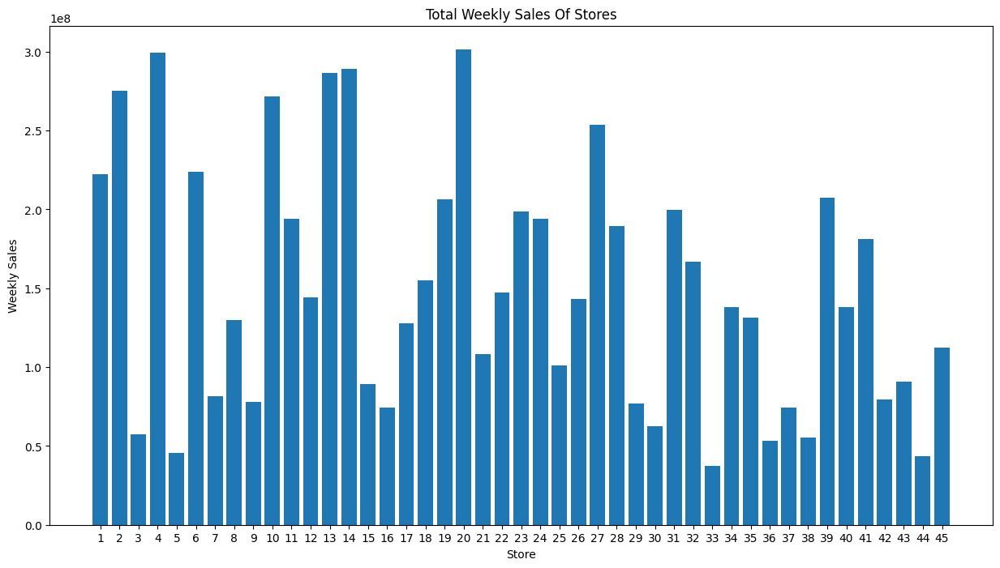

In [18]:
plt.figure(figsize = (15, 8))
plt.bar(total_sales_by_store['Store'], total_sales_by_store['Weekly_Sales'])
plt.xlabel("Store")
plt.ylabel("Weekly Sales")
plt.xticks(range(1, 46))
plt.title("Total Weekly Sales Of Stores")

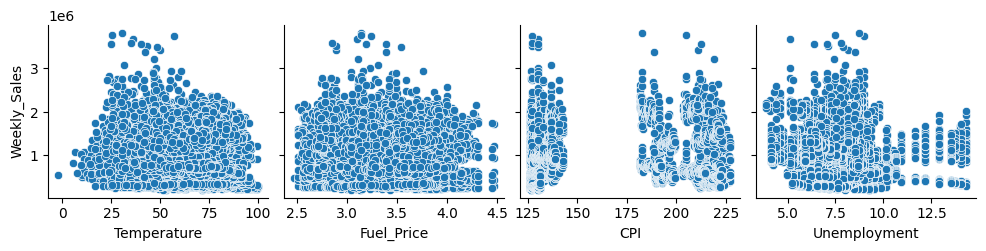

In [19]:
sns.pairplot(df,x_vars=['Temperature', 'Fuel_Price', 'CPI', 'Unemployment'], y_vars=['Weekly_Sales'], kind="scatter")

Text(0.5, 1.0, 'Correlation Matrix')

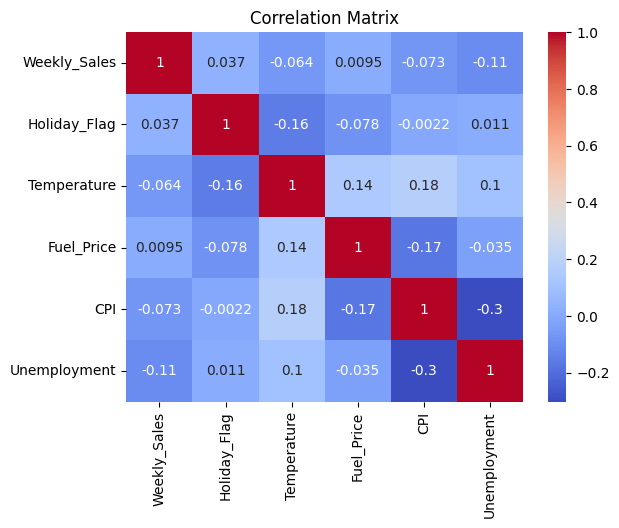

In [20]:
numeric_columns = ['Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
corr_matrix = df[numeric_columns].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")

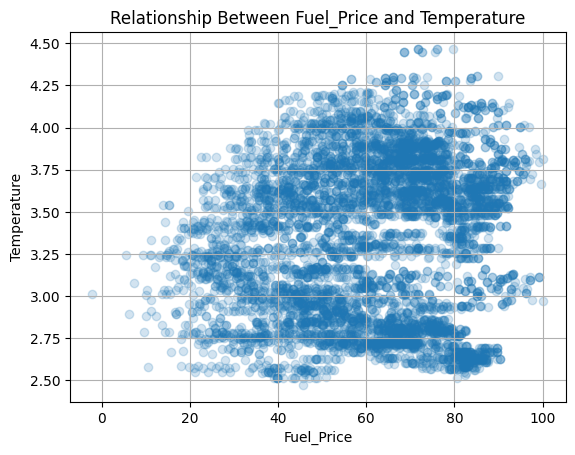

In [21]:
plt.scatter(df['Temperature'], df['Fuel_Price'], alpha=0.2)
plt.title('Relationship Between Fuel_Price and Temperature')
plt.xlabel('Fuel_Price')
plt.ylabel('Temperature')
plt.grid(True)

<Axes: xlabel='Date', ylabel='Weekly_Sales'>

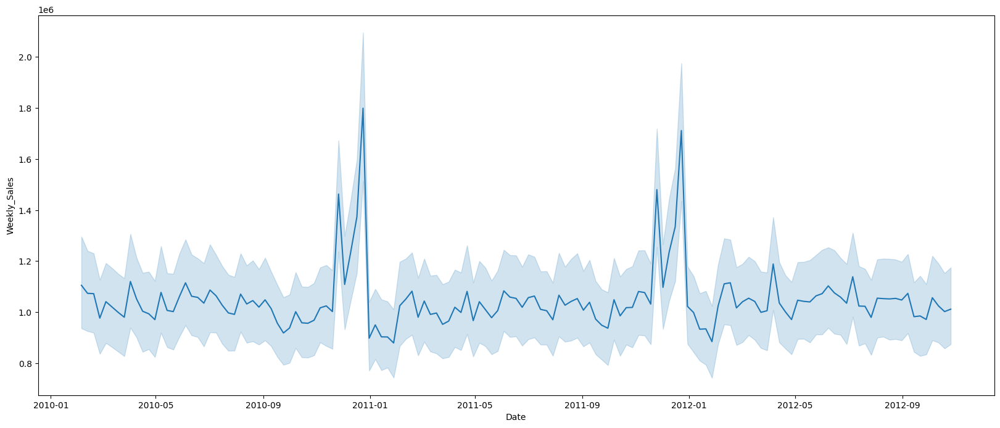

In [22]:
plt.figure(figsize=(20, 8))
sns.lineplot(x='Date', y='Weekly_Sales', data = df) 

#### Insights On Walmart Dataset

##### A) If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?

<Axes: xlabel='Unemployment', ylabel='Weekly_Sales'>

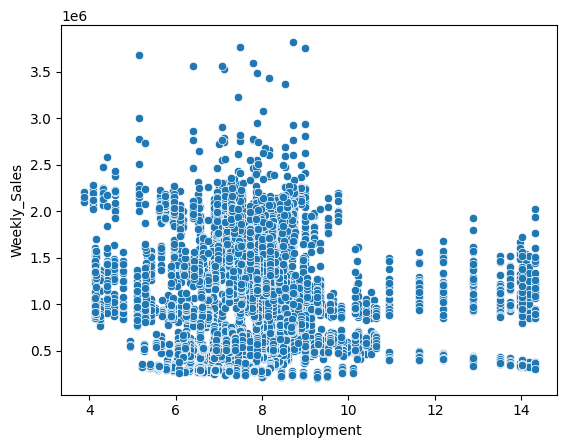

In [23]:
sns.scatterplot(x=df['Unemployment'], y=df['Weekly_Sales'])

<Axes: xlabel='Store', ylabel='Weekly_Sales'>

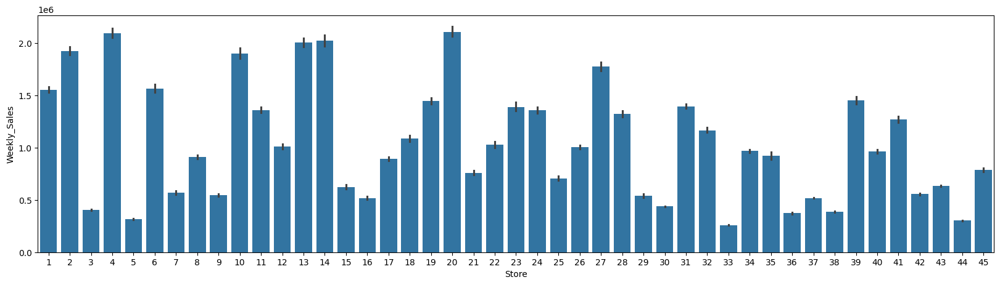

In [24]:
plt.figure(figsize=(20, 5))
sns.barplot(x=df['Store'], y=df['Weekly_Sales'])

<Axes: xlabel='Store', ylabel='Unemployment'>

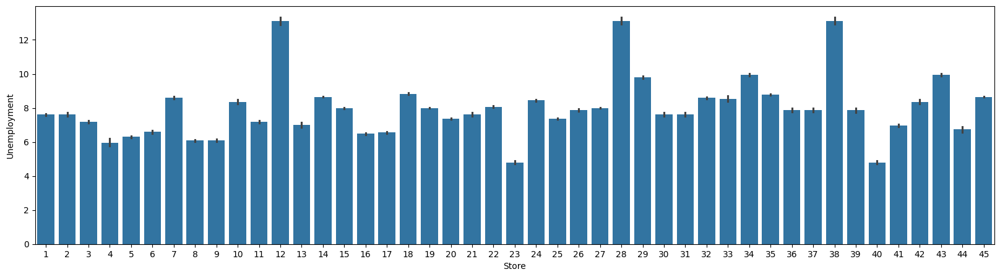

In [25]:
 plt.figure(figsize=(20, 5))
sns.barplot(x=df['Store'], y=df['Unemployment'])

In [26]:
df.groupby(by='Store').agg({'Weekly_Sales':'sum', 'Unemployment':'sum'})

,Weekly_Sales,Unemployment
Store,,
1,2.224028e+08,1088.290
2,2.753824e+08,1090.210
3,5.758674e+07,1026.309
4,2.995440e+08,852.951
5,4.547569e+07,900.243
6,2.237561e+08,944.787
7,8.159828e+07,1227.760
8,1.299512e+08,871.134
9,7.778922e+07,872.283


In [27]:
store_correlation=df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr()['Unemployment']

In [28]:
store_correlation

Store              
1      Weekly_Sales   -0.097955
       Unemployment    1.000000
2      Weekly_Sales    0.066325
       Unemployment    1.000000
3      Weekly_Sales   -0.230413
                         ...   
43     Unemployment    1.000000
44     Weekly_Sales   -0.780076
       Unemployment    1.000000
45     Weekly_Sales   -0.004041
       Unemployment    1.000000
Name: Unemployment, Length: 90, dtype: float64

In [29]:
sorted_store_corr = store_correlation[:, 'Weekly_Sales'].abs().sort_values(ascending=False)

In [30]:
sorted_store_corr.head(3)

Store
36    0.833734
38    0.785290
44    0.780076
Name: Unemployment, dtype: float64

 - Store 36, 38, 44 are more affected by Unemployment

#### B) If the weekly sales show a seasonal trend, when and what could be the reason?

In [31]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX, SARIMAXResults

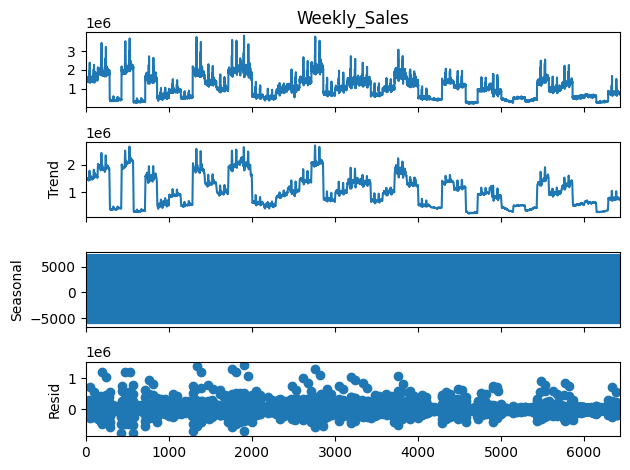

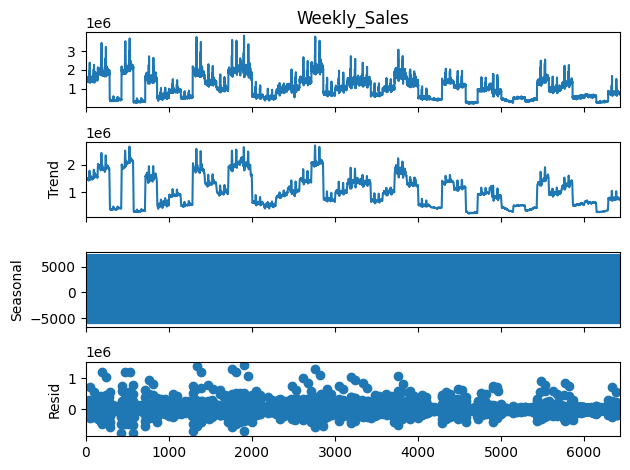

In [32]:
result = seasonal_decompose(df['Weekly_Sales'], model = 'additive', period = 7)
result.plot()

In [33]:
new_df_add=pd.concat([result.seasonal,result.trend,result.resid,result
.observed],axis=1)
new_df_add.columns=["seasonality","trend","residual","actual_values"]
new_df_add.head(5)

,seasonality,trend,residual,actual_values
0,-3978.147451,NaN,NaN,1643690.90
1,7215.473014,NaN,NaN,1641957.44
2,5479.430196,NaN,NaN,1611968.17
3,1547.439597,1.539173e+06,-130992.443883,1409727.59
4,-1440.045828,1.504992e+06,51254.271542,1554806.68


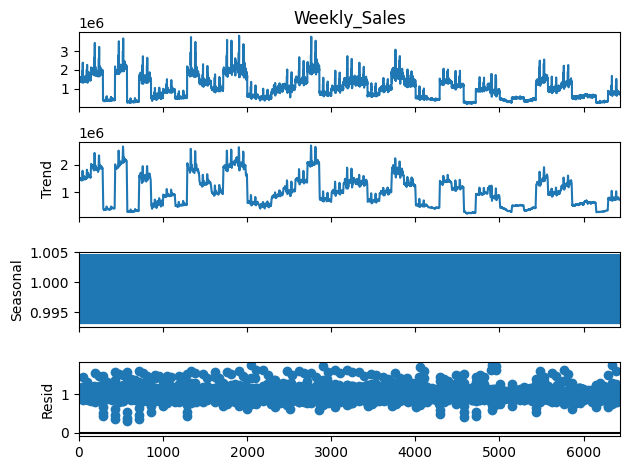

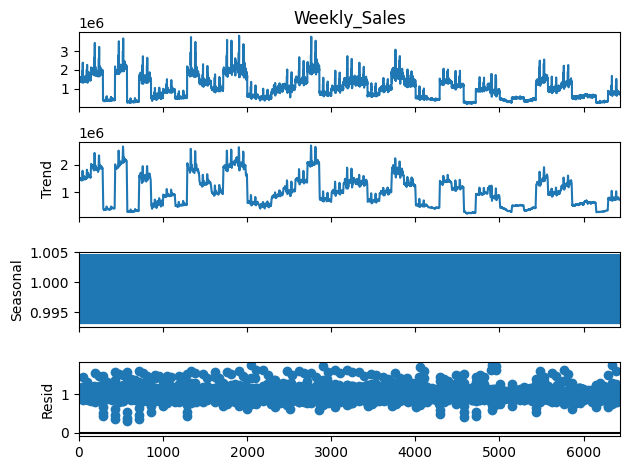

In [34]:
result=seasonal_decompose(df['Weekly_Sales'],model='multiplicative',
period=7)
result.plot()

In [35]:
new_df_mul=pd.concat([result.seasonal,result.trend,result.resid,result
.observed],axis=1)
new_df_mul.columns=["seasonality","trend","residual","actual_values"]
new_df_mul.head(5)

,seasonality,trend,residual,actual_values
0,0.998500,NaN,NaN,1643690.90
1,1.003554,NaN,NaN,1641957.44
2,1.004503,NaN,NaN,1611968.17
3,1.003575,1.539173e+06,0.912637,1409727.59
4,0.998428,1.504992e+06,1.034726,1554806.68


C:\Users\zayna\AppData\Local\Temp\ipykernel_5580\642300183.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Weekly_Sales'],hist=True)


[]

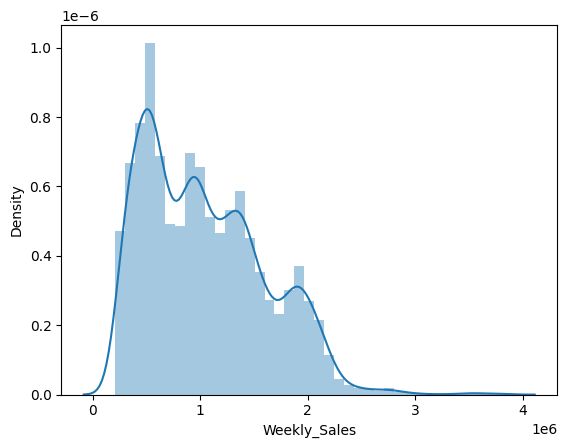

In [36]:
sns.distplot(df['Weekly_Sales'],hist=True)
plt.plot()

 - Weekly Sales Show a Seasonal Trend

In [37]:
df.Holiday_Flag.value_counts()

Holiday_Flag
0    5985
1     450
Name: count, dtype: int64

In [38]:
Total_by_store = df.groupby(['Holiday_Flag'],as_index=False).agg({'Weekly_Sales': 'sum'})
Total_by_store

,Holiday_Flag,Weekly_Sales
0,0,6.231919e+09
1,1,5.052996e+08


<Axes: xlabel='Holiday_Flag', ylabel='Weekly_Sales'>

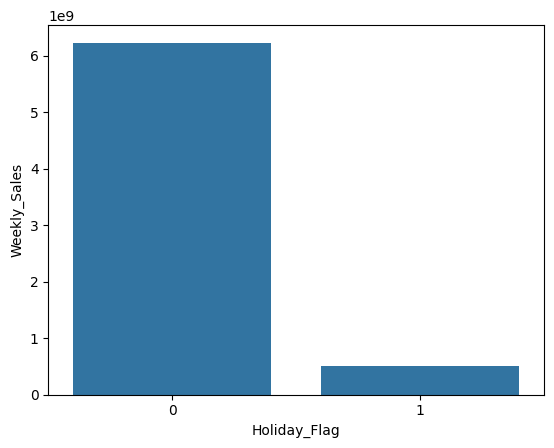

In [39]:
sns.barplot(x=Total_by_store['Holiday_Flag'],y=Total_by_store['Weekly_Sales'])

- Average Weekly Sales in Holiday Week are more that that of Non Holiday weeks

In [40]:
Total_by_store = df.groupby(['Store','Holiday_Flag'],as_index=False).agg({'Weekly_Sales': 'sum','Temperature':"mean"})
Total_by_store 

,Store,Holiday_Flag,Weekly_Sales,Temperature
0,1,0,2.057453e+08,69.087669
1,1,1,1.665748e+07,57.921000
2,2,0,2.545898e+08,69.025263
3,2,1,2.079267e+07,57.458000
4,3,0,5.320862e+07,72.076617
...,...,...,...,...
85,43,1,6.359463e+06,58.168000
86,44,0,4.033273e+07,54.503459
87,44,1,2.960356e+06,42.973000
88,45,0,1.040324e+08,58.561729


In [41]:
Total_by_store[Total_by_store["Weekly_Sales"]==Total_by_store["Weekly_Sales"].max()]

,Store,Holiday_Flag,Weekly_Sales,Temperature
38,20,0,2.789074e+08,56.242256


In [42]:
Total_by_store[Total_by_store["Weekly_Sales"]==Total_by_store["Weekly_Sales"].min()]

,Store,Holiday_Flag,Weekly_Sales,Temperature
65,33,1,2625945.19,67.25


#### C)Does temperature affect the weekly sales in any manner? 

<Axes: xlabel='Temperature', ylabel='Weekly_Sales'>

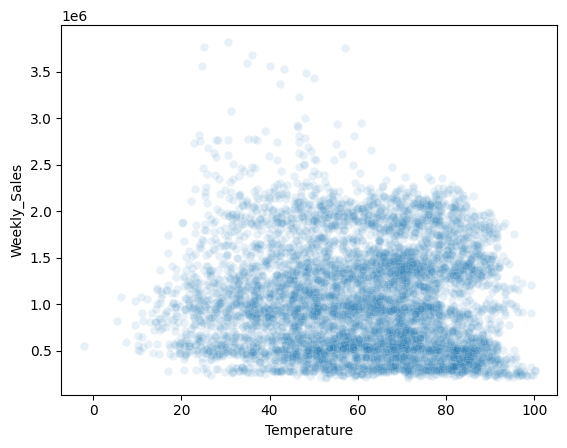

In [43]:
sns.scatterplot(x = df['Temperature'],y = df['Weekly_Sales'], alpha=0.1)

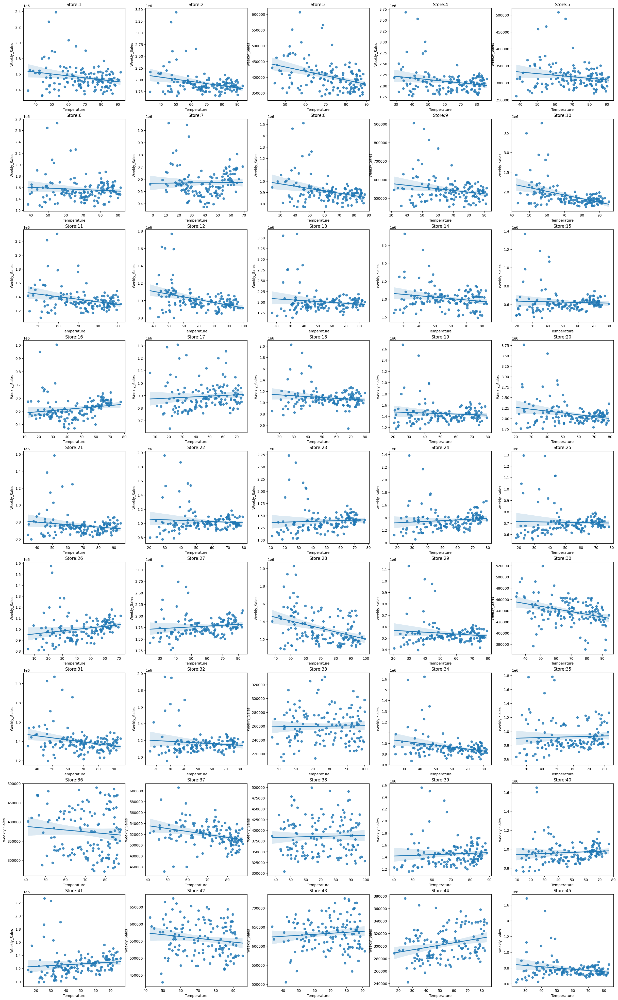

In [44]:
plt.subplots(9,5, figsize=(30,50))
for i in range (1,46):
 plt.subplot(9,5,i)
 sns.regplot(x='Temperature', y='Weekly_Sales', 
data=df[df['Store']==i])
 plt.title(f'Store:{i}')

In [45]:
Total_by_temp =df.groupby('Temperature',as_index=False).agg({'Weekly_Sales': 'sum'})
Total_by_temp

,Temperature,Weekly_Sales
0,-2.06,558027.77
1,5.54,817485.14
2,6.23,1083071.14
3,7.46,593875.46
4,9.51,775910.43
...,...,...
3523,99.20,239198.36
3524,99.22,2446625.50
3525,99.66,237095.82
3526,100.07,297753.49


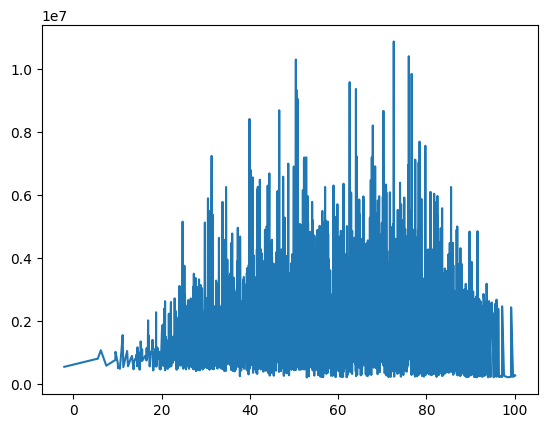

In [46]:
plt.plot(Total_by_temp['Temperature'],Total_by_temp['Weekly_Sales'])

<Axes: xlabel='Temperature', ylabel='Weekly_Sales'>

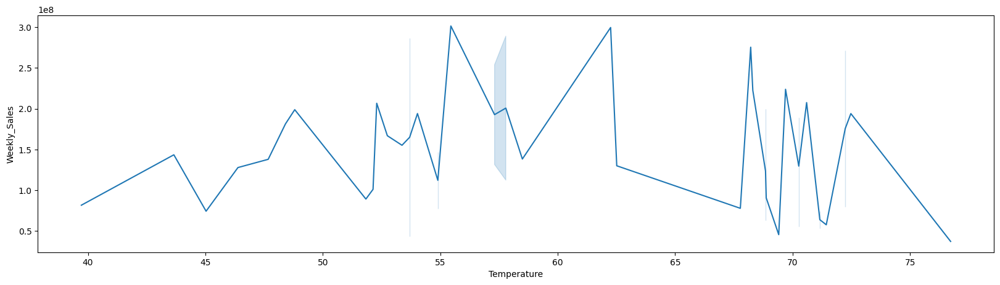

In [47]:
Total_by_store = df.groupby(['Store'], as_index=False).agg({'Weekly_Sales': 'sum', 'Temperature': 'mean'})
plt.figure(figsize=(20, 5))
sns.lineplot(x='Temperature', y='Weekly_Sales', data=Total_by_store)


- Temperature affects the weekly sales
- At Low and High Temperatures the weekly sales are lower
- At moderate temperatures the Weekly sales are higher

#### D) How is the Consumer Price index affecting the weekly sales of various stores?

Text(0.5, 1.0, 'CPI vs Weekly Sales')

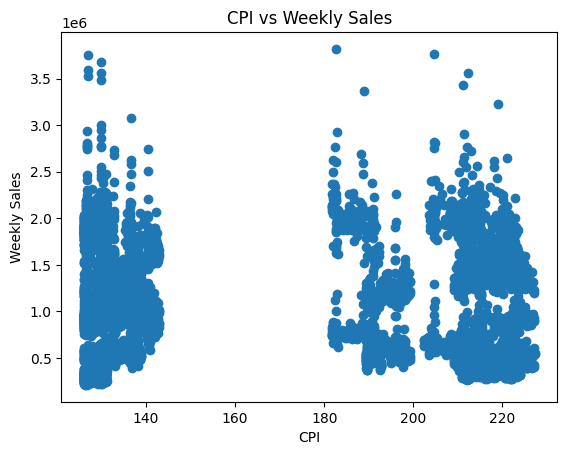

In [48]:
plt.scatter(df["CPI"],df['Weekly_Sales'])
plt.xlabel('CPI')
plt.ylabel('Weekly Sales')
plt.title("CPI vs Weekly Sales")

<Axes: xlabel='Store', ylabel='CPI'>

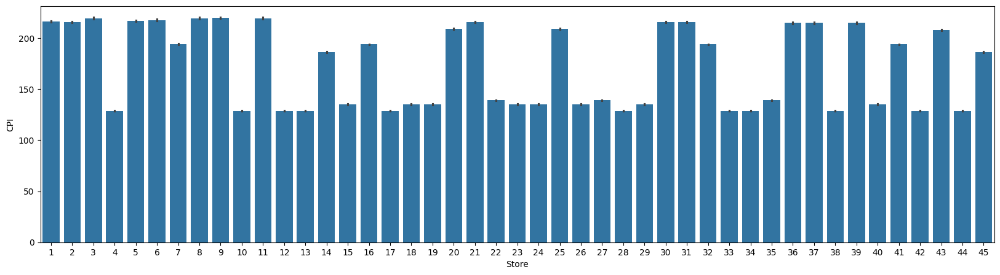

In [49]:
plt.figure(figsize=(20, 5))
sns.barplot(x = df['Store'], y=df['CPI'])

<Axes: xlabel='Store', ylabel='Weekly_Sales'>

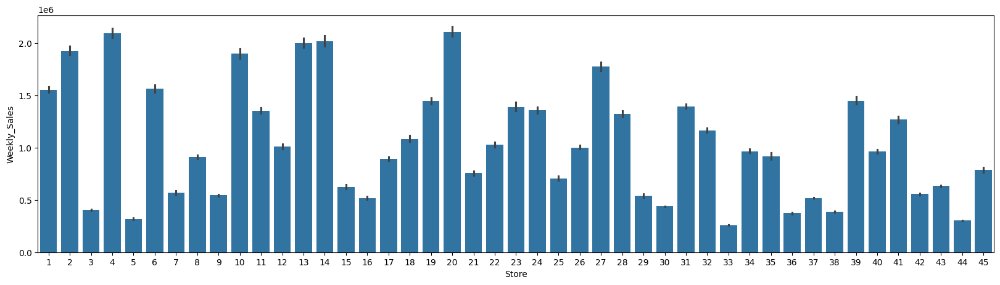

In [50]:
plt.figure(figsize=(20, 5))
sns.barplot(x = df['Store'], y=df['Weekly_Sales'])

In [51]:
Total_by_store = df.groupby('Store').agg({'Weekly_Sales': 'sum', 'CPI': 'sum'})
Total_by_store

,Weekly_Sales,CPI
Store,,
1,2.224028e+08,30887.555523
2,2.753824e+08,30837.422420
3,5.758674e+07,31372.988971
4,2.995440e+08,18401.192733
5,4.547569e+07,30968.878137
6,2.237561e+08,31110.107182
7,8.159828e+07,27693.986741
8,1.299512e+08,31379.780750
9,7.778922e+07,31406.616557


In [52]:
Total_by_store[Total_by_store.CPI==Total_by_store.CPI.max()]

,Weekly_Sales,CPI
Store,,
9,77789218.99,31406.616557


In [53]:
Total_by_store[Total_by_store.CPI==Total_by_store.CPI.min()]

,Weekly_Sales,CPI
Store,,
4,2.995440e+08,18401.192733
10,2.716177e+08,18401.192733
12,1.442872e+08,18401.192733
13,2.865177e+08,18401.192733
17,1.277821e+08,18401.192733
28,1.892637e+08,18401.192733
33,3.716022e+07,18401.192733
34,1.382498e+08,18401.192733
38,5.515963e+07,18401.192733


- When CPI is higher Weekly Sales are Lower

#### E) Top performing stores according to the historical data

In [54]:
Total_data_by_store=df.groupby('Store',as_index=False).agg({"Weekly_Sales":"sum"})
Top_sales_store=Total_data_by_store.sort_values(by='Weekly_Sales',ascending=False)
Top_sales_store

,Store,Weekly_Sales
19,20,3.013978e+08
3,4,2.995440e+08
13,14,2.889999e+08
12,13,2.865177e+08
1,2,2.753824e+08
9,10,2.716177e+08
26,27,2.538559e+08
5,6,2.237561e+08
0,1,2.224028e+08
38,39,2.074455e+08


In [55]:
Top_sales_store.head()

,Store,Weekly_Sales
19,20,3.013978e+08
3,4,2.995440e+08
13,14,2.889999e+08
12,13,2.865177e+08
1,2,2.753824e+08


- The Top Performing stores are Stor number 20, 4, 14, 13, 2

#### F) The worst performing store, and how significant is the difference between the highest and lowest performing stores.

In [56]:
Top_sales_store.tail(1)

,Store,Weekly_Sales
32,33,37160221.96


- The Worst Performing store is Store No 33

In [57]:
Top_sales_store.max()['Weekly_Sales'] - Top_sales_store.min()['Weekly_Sales']

264237570.49999997

- The Difference Between the best and the worst performing store is 264237570.49999997

In [58]:
df.Date=pd.to_datetime(df.Date,format="%d-%m-%Y")

In [59]:
df=df.set_index("Date")

### 2. Use predictive modeling techniques to forecast the sales for each store for the next 12 weeks.

#### Time Series Analysis

In [60]:
df_target=df.loc[:,['Store',"Weekly_Sales"]]

In [61]:
df_target

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,45,713173.95
2012-10-05,45,733455.07
2012-10-12,45,734464.36


In [62]:
from pmdarima.arima import auto_arima
model = auto_arima(df["Weekly_Sales"], seasonal=True, stepwise=True, trace=True)

d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'f

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=173103.554, Time=4.29 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=174457.419, Time=0.24 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=173626.224, Time=0.65 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=173359.721, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=174455.423, Time=0.16 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=173301.748, Time=2.83 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=173266.524, Time=3.18 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=172741.309, Time=4.85 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=172905.020, Time=4.69 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=172730.428, Time=12.92 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=172847.176, Time=4.30 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=172588.751, Time=23.11 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=172597.113, Time=6.85 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(5,1,3)(0,0,0)[0] intercept   : AIC=172572.018, Time=13.13 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=172609.343, Time=19.04 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(5,1,4)(0,0,0)[0] intercept   : AIC=172568.730, Time=15.32 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,4)(0,0,0)[0] intercept   : AIC=172608.399, Time=12.34 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(5,1,5)(0,0,0)[0] intercept   : AIC=172515.273, Time=27.51 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,5)(0,0,0)[0] intercept   : AIC=172515.184, Time=12.83 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,5)(0,0,0)[0] intercept   : AIC=172520.188, Time=11.26 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,4)(0,0,0)[0] intercept   : AIC=172730.332, Time=13.91 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,5)(0,0,0)[0]             : AIC=172513.152, Time=12.63 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,5)(0,0,0)[0]             : AIC=172518.165, Time=9.96 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,4)(0,0,0)[0]             : AIC=172606.296, Time=10.99 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(5,1,5)(0,0,0)[0]             : AIC=172513.236, Time=21.20 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,4)(0,0,0)[0]             : AIC=172728.335, Time=11.63 sec


d:\yourenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(5,1,4)(0,0,0)[0]             : AIC=172566.624, Time=14.47 sec

Best model:  ARIMA(4,1,5)(0,0,0)[0]          
Total fit time: 275.163 seconds


##### Store 1 Dataset

In [63]:
result = adfuller(df_target[df_target['Store']==1]['Weekly_Sales'])
result

(-5.102186145192289,
 1.3877788330759307e-05,
 4,
 138,
 {'1%': -3.47864788917503,
  '5%': -2.882721765644168,
  '10%': -2.578065326612056},
 3412.7325502876756)

In [64]:
p_value=result[1]
p_value

1.3877788330759307e-05

###### p value is close to 0 and we can conclude that the data is stationary

In [65]:
store1=pd.DataFrame(df_target[df_target['Store']==1]['Weekly_Sales'])
store1=store1.sort_index()
store1

,Weekly_Sales
Date,
2010-02-05,1643690.90
2010-02-12,1641957.44
2010-02-19,1611968.17
2010-02-26,1409727.59
2010-03-05,1554806.68
...,...
2012-09-28,1437059.26
2012-10-05,1670785.97
2012-10-12,1573072.81


#### Visualizing Seasonality

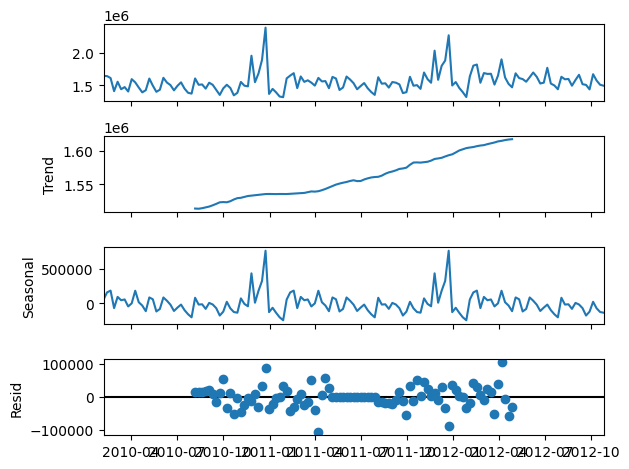

In [66]:
decompose = seasonal_decompose(store1)
decompose_plot=decompose.plot()

In [67]:
acf_plot=acf(store1["Weekly_Sales"])

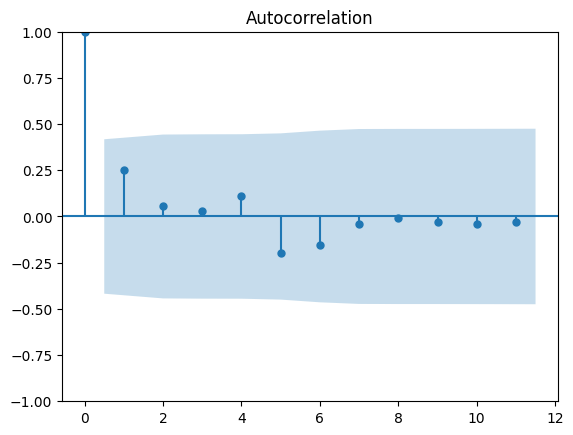

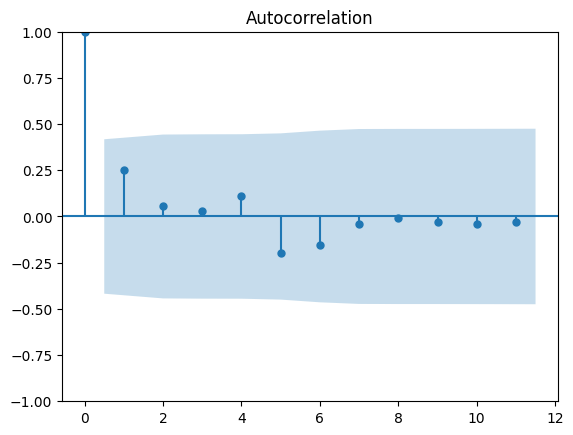

In [68]:
plot_acf(acf_plot)

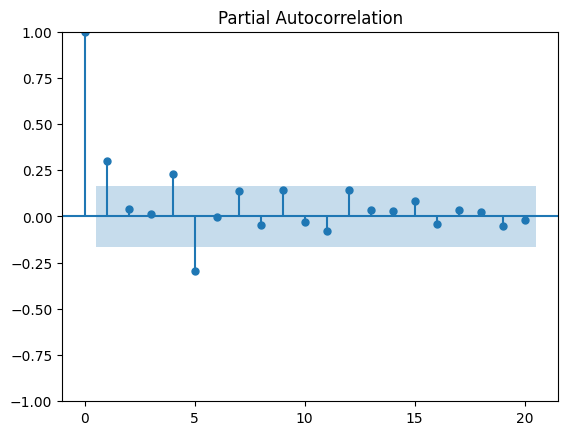

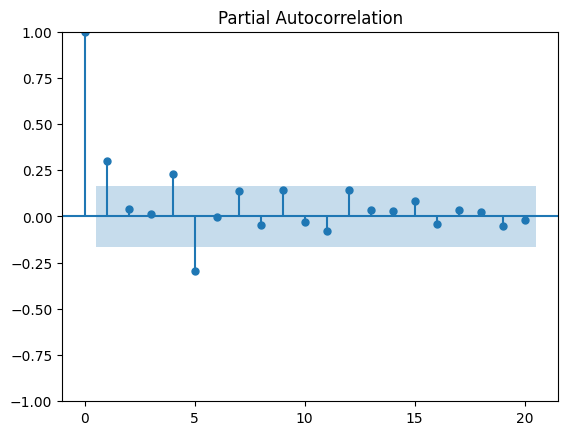

In [69]:
plot_pacf(store1["Weekly_Sales"],lags=20)

In [70]:
store1['lag1']=store1['Weekly_Sales'].diff()

In [71]:
store1['lag52']=store1['Weekly_Sales'].diff(52)

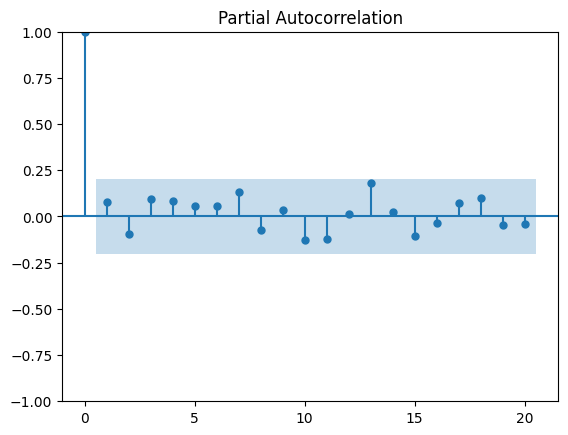

In [72]:
pacf_values=plot_pacf(store1['lag52'].dropna(),lags=20)

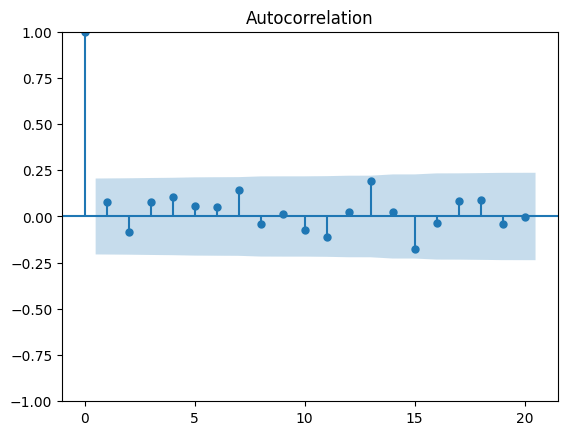

In [73]:
acf_values=plot_acf(store1['lag52'].dropna(),lags=20)

In [74]:
# From the above, pacf(p) ,acf(q) value is 0
pacf_values=sm.tsa.pacf(store1['Weekly_Sales'],nlags=20)
pacf_values

array([ 1.        ,  0.30375985,  0.04021628,  0.01219543,  0.23927843,
       -0.30788835, -0.0014493 ,  0.14798536, -0.05206473,  0.1547872 ,
       -0.03652748, -0.08797706,  0.16184013,  0.03250986,  0.03380417,
        0.10062548, -0.04966531,  0.04265725,  0.02866535, -0.0672978 ,
       -0.0144685 ])

 - p[1]=0.30 value will be newar to zero then p=0

In [75]:
train = store1.iloc[:115]['Weekly_Sales']
test = store1.iloc[115:]['Weekly_Sales']

In [76]:
# Training The Model
model=SARIMAX(train,order=(0,1,0),seasonal_order=(0,1,0,52))
model_fit = model.fit()
model_fit.summary()

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                       Weekly_Sales   No. Observations:                  115
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 52)   Log Likelihood                -801.151
Date:                            Mon, 27 Jan 2025   AIC                           1604.302
Time:                                    02:55:27   BIC                           1606.429
Sample:                                02-05-2010   HQIC                          1605.137
                                     - 04-13-2012                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4.169e+09   3.17e+08     13.134      0.000    3.55e+09    4.79e+09
===================================================================================
Ljung-Box (L1) (Q):                   9.70   Jarque-Bera (JB):                 2.72
Prob(Q):                              0.00   Prob(JB):                         0.26
Heteroskedasticity (H):               1.79   Skew:                             0.06
Prob(H) (two-sided):                  0.19   Kurtosis:                         4.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

##### Testing The Model

In [77]:
pred = model_fit.predict(start= len(train),end=len(train)+len(test)- 1,dynamic=True)

In [78]:
pred

2012-04-20    1625962.51
2012-04-27    1516233.39
2012-05-04    1690533.98
2012-05-11    1665918.28
2012-05-18    1489360.97
2012-05-25    1527189.37
2012-06-01    1696221.11
2012-06-08    1650091.02
2012-06-15    1593257.56
2012-06-22    1499972.85
2012-06-29    1549680.79
2012-07-06    1595992.34
2012-07-13    1516262.67
2012-07-20    1458069.52
2012-07-27    1413362.49
2012-08-03    1685526.45
2012-08-10    1586289.79
2012-08-17    1591904.13
2012-08-24    1525836.16
2012-08-31    1611371.92
2012-09-07    1601613.94
2012-09-14    1575402.48
2012-09-21    1441162.97
2012-09-28    1455704.53
2012-10-05    1692132.65
2012-10-12    1554668.63
2012-10-19    1563705.48
2012-10-26    1506391.79
Freq: W-FRI, Name: predicted_mean, dtype: float64

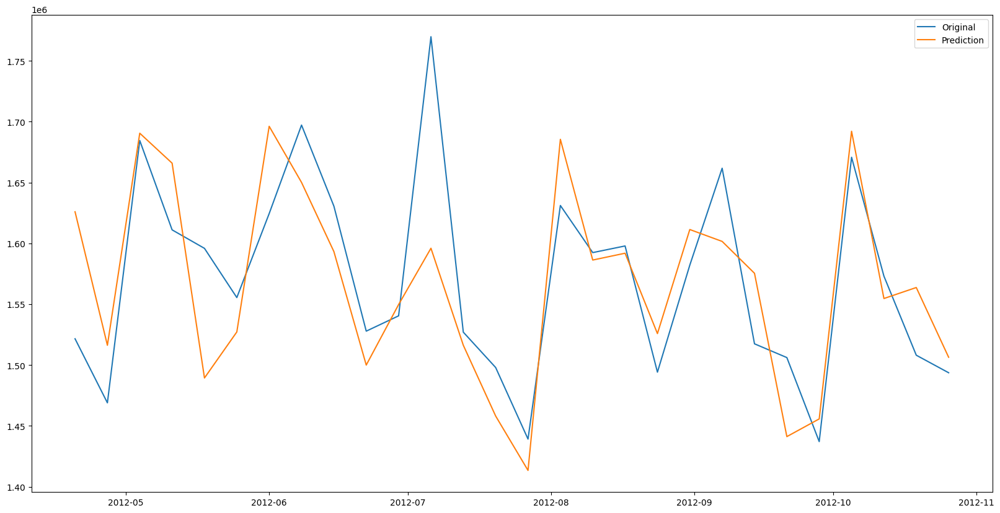

In [79]:
plt.figure(figsize=(20,10))
plt.plot(test,label="Original")
plt.plot(pred,label="Prediction")
plt.legend()

##### Forecasting for Next 12 Weeks

In [80]:
forecast=model_fit.forecast(steps=12)

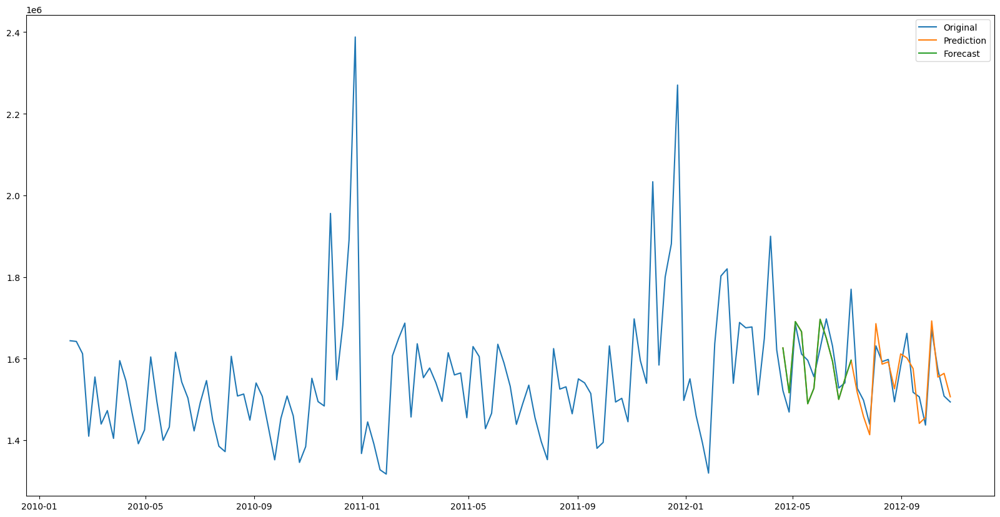

In [81]:
plt.figure(figsize=(20,10))
plt.plot(store1['Weekly_Sales'],label="Original")
plt.plot(pred,label="Prediction")
plt.plot(forecast,label="Forecast")
plt.legend()

In [82]:
comparison = pd.DataFrame({'Actual': test, 'Predicted': pred})
comparison.dropna(inplace=True)

In [83]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(comparison['Actual'], comparison['Predicted'])
mse = mean_squared_error(comparison['Actual'], comparison['Predicted'])
rmse = np.sqrt(mse)
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')

Mean Absolute Error (MAE): 43867.10071428573
Mean Squared Error (MSE): 3251568436.6039357
Root Mean Squared Error (RMSE): 57022.525694710646


d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


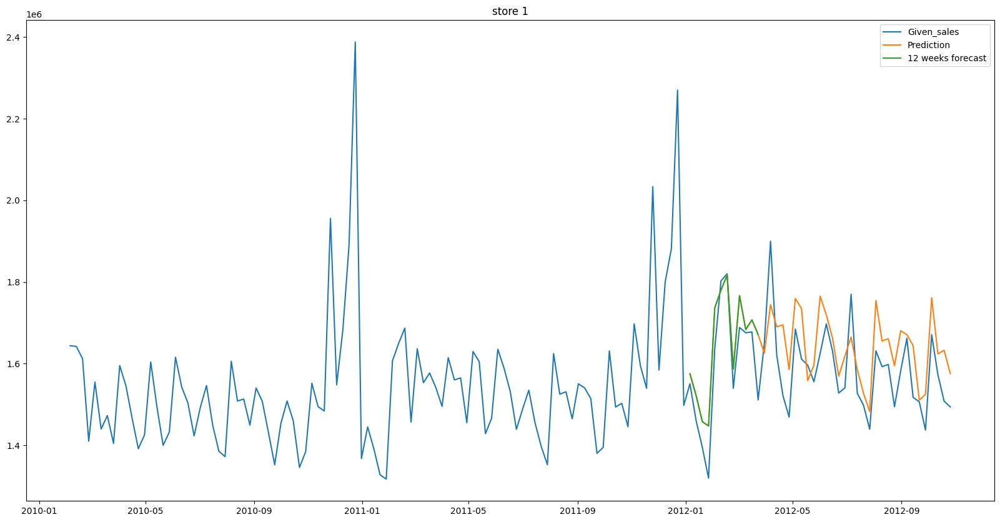

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


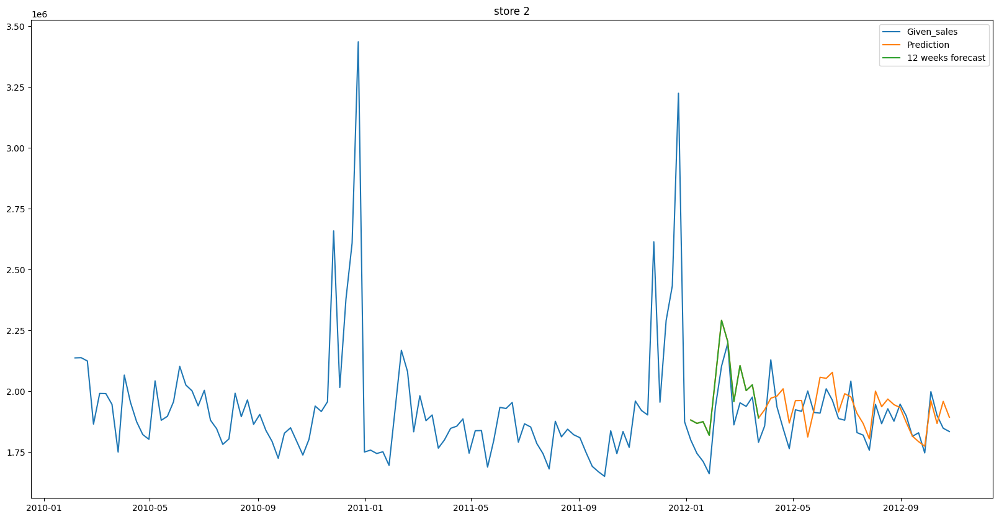

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


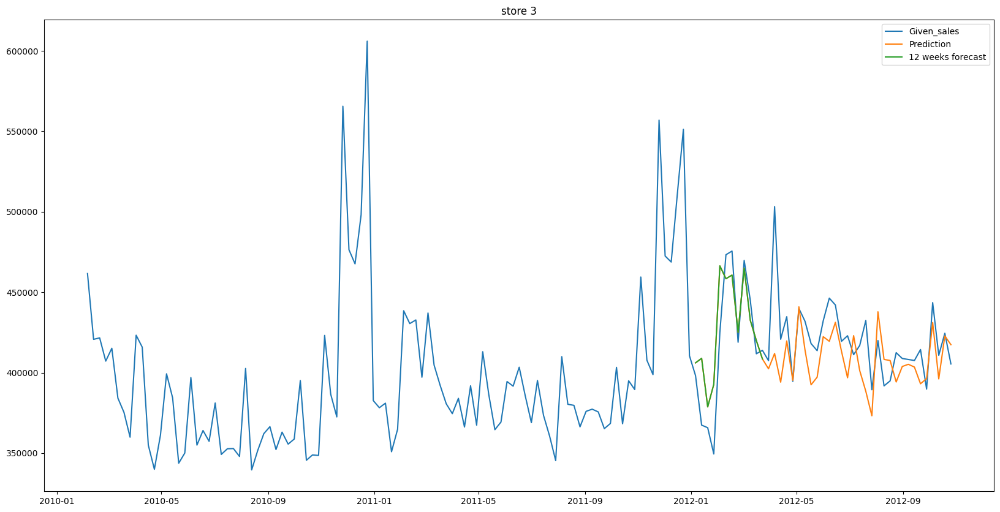

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


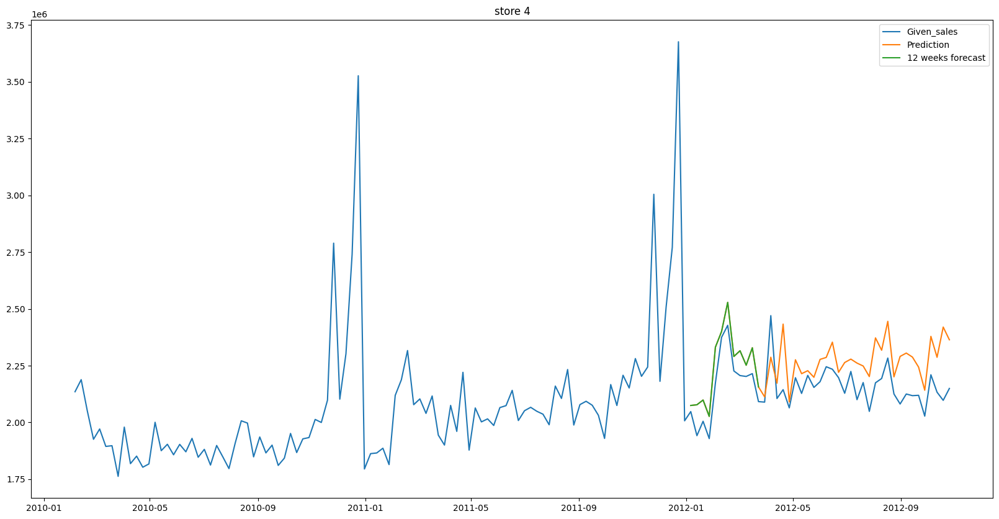

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


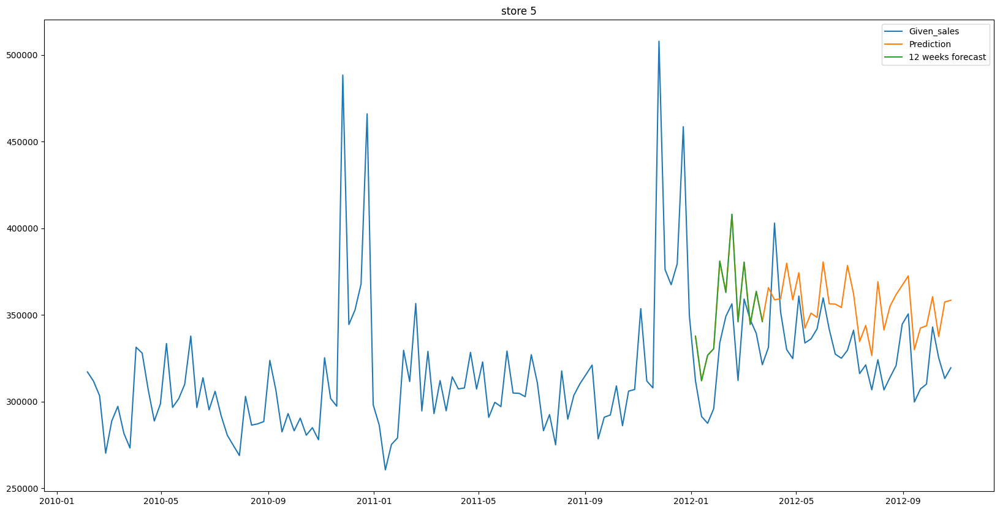

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


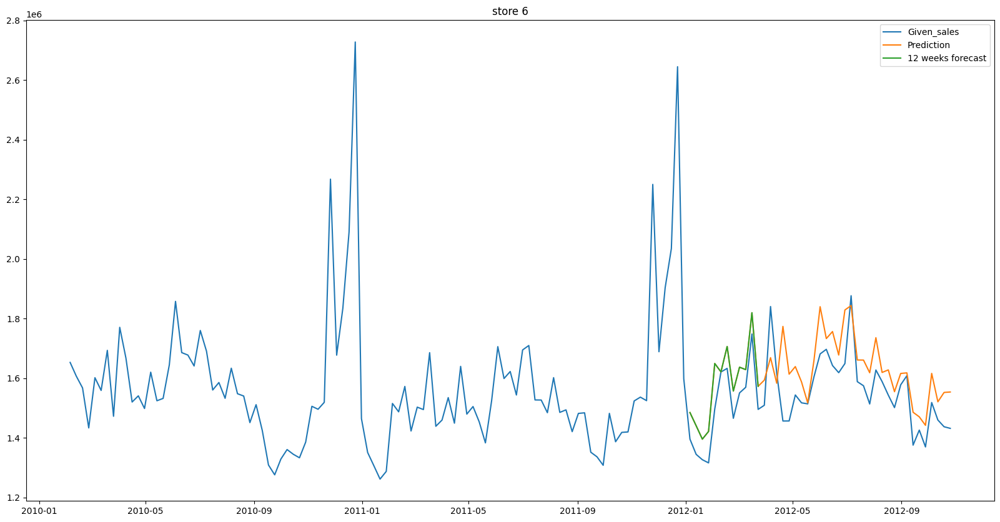

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


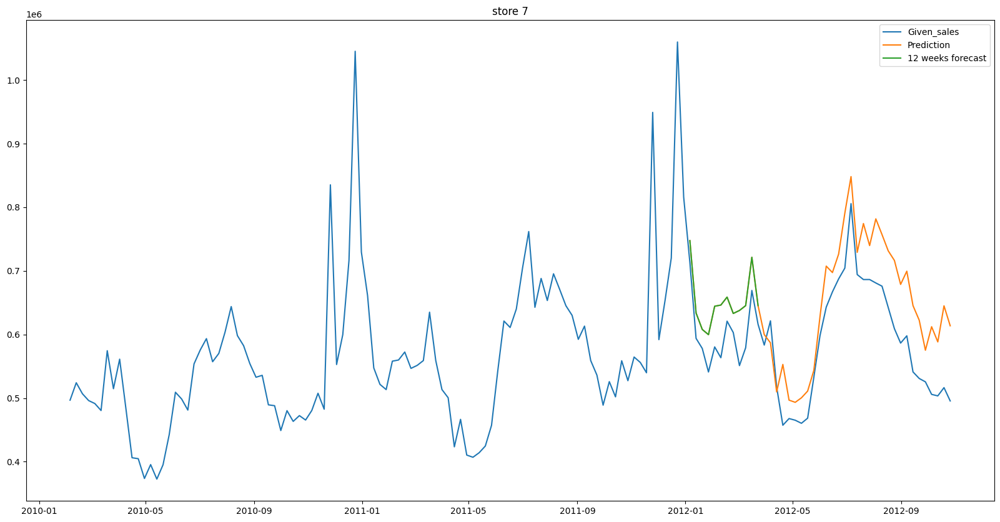

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


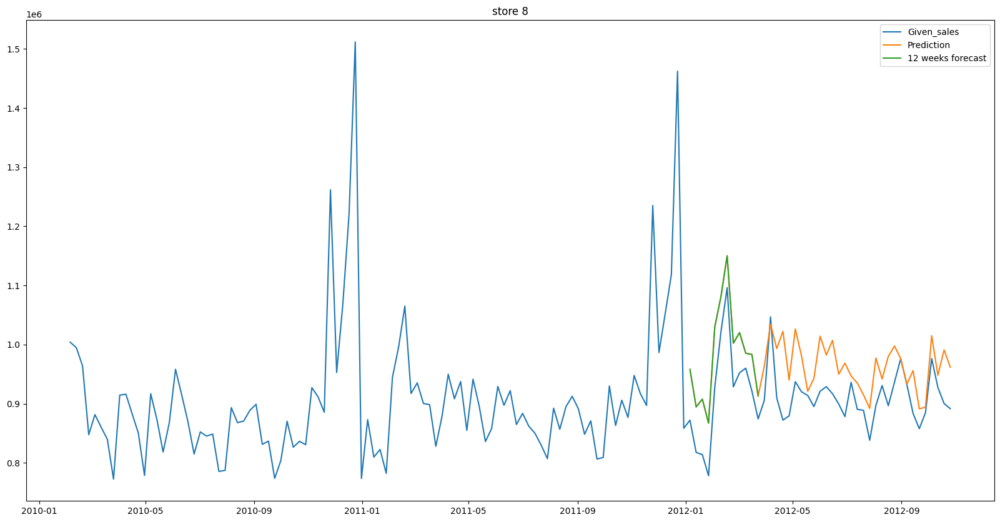

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


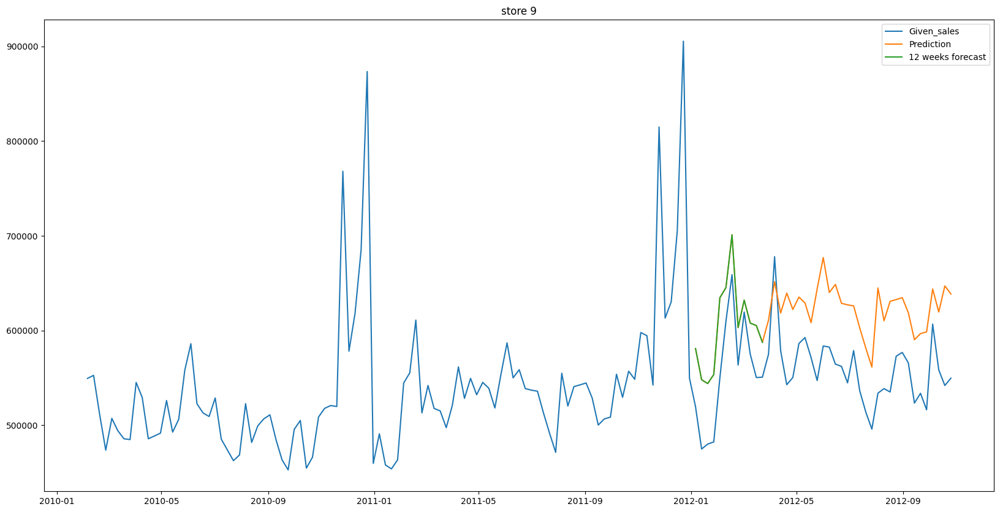

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


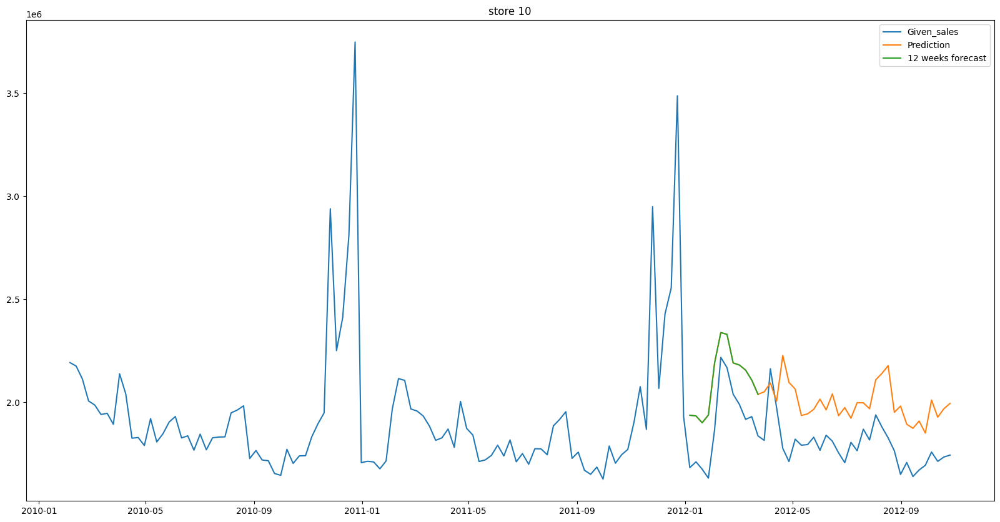

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


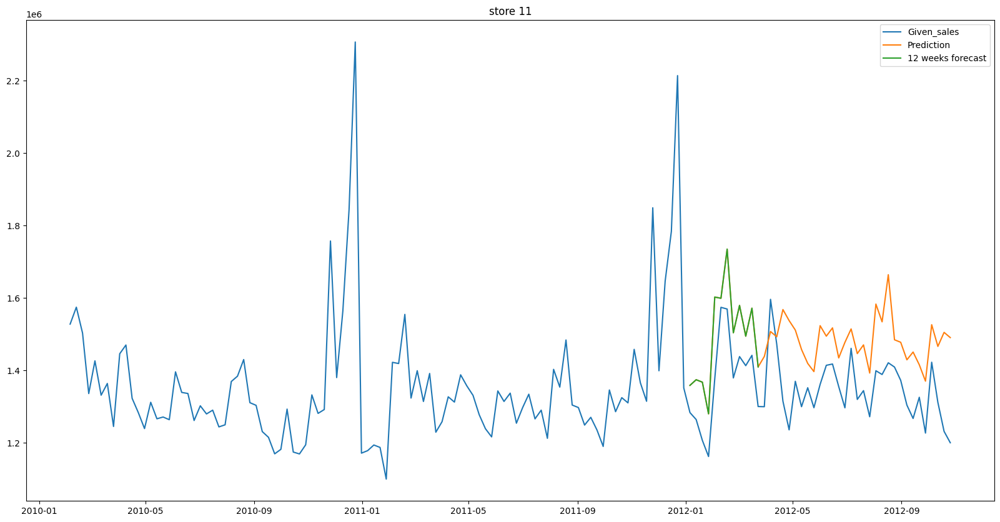

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


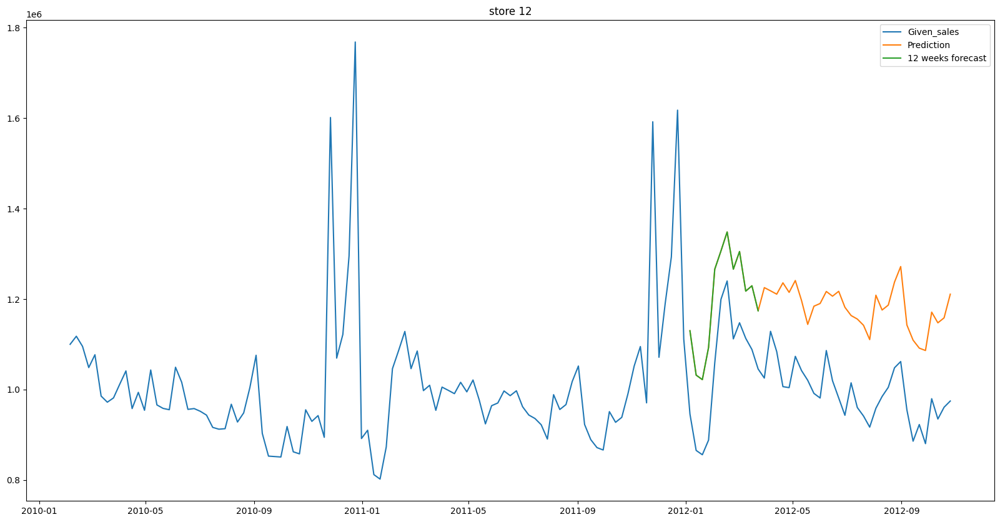

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


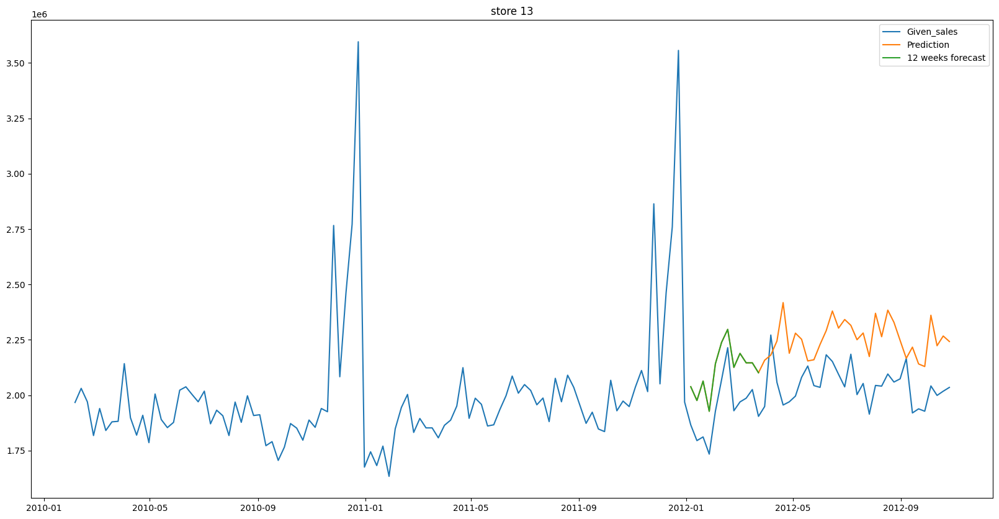

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


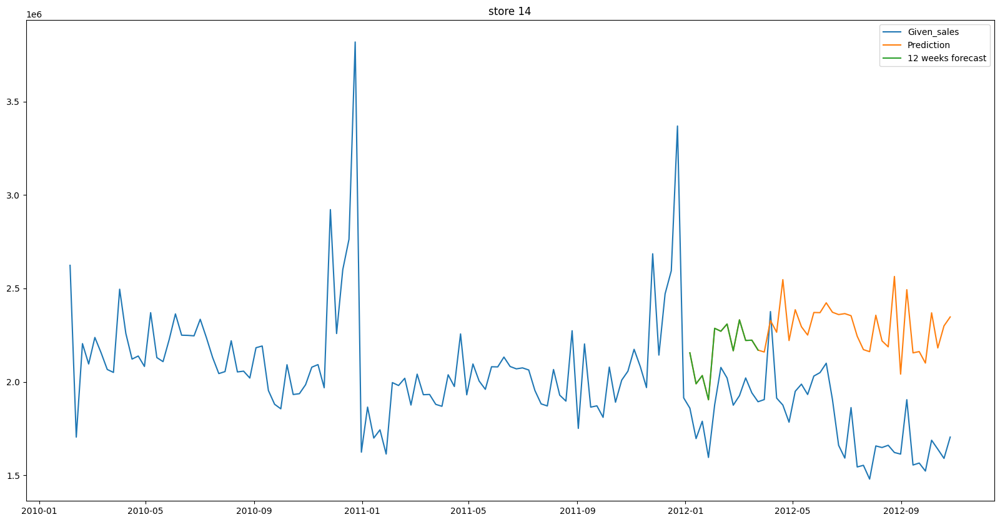

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


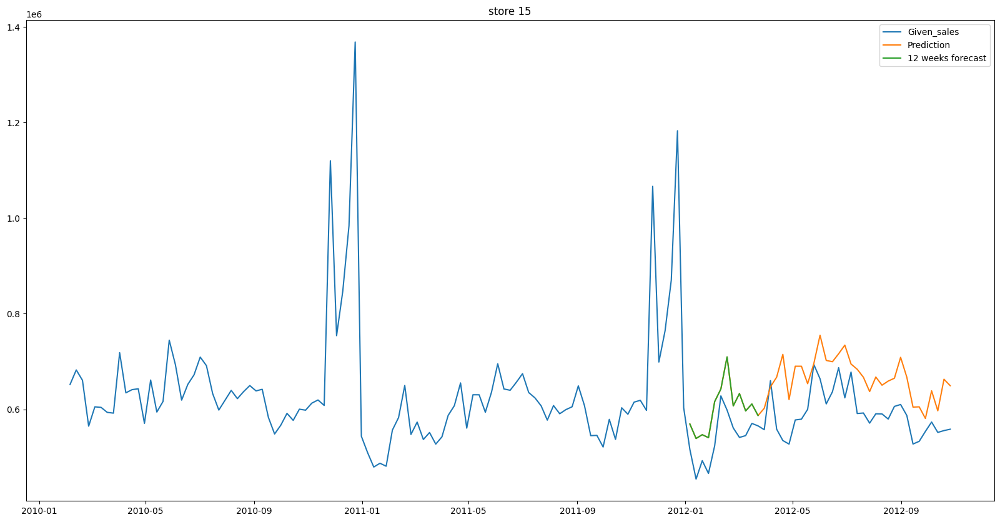

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


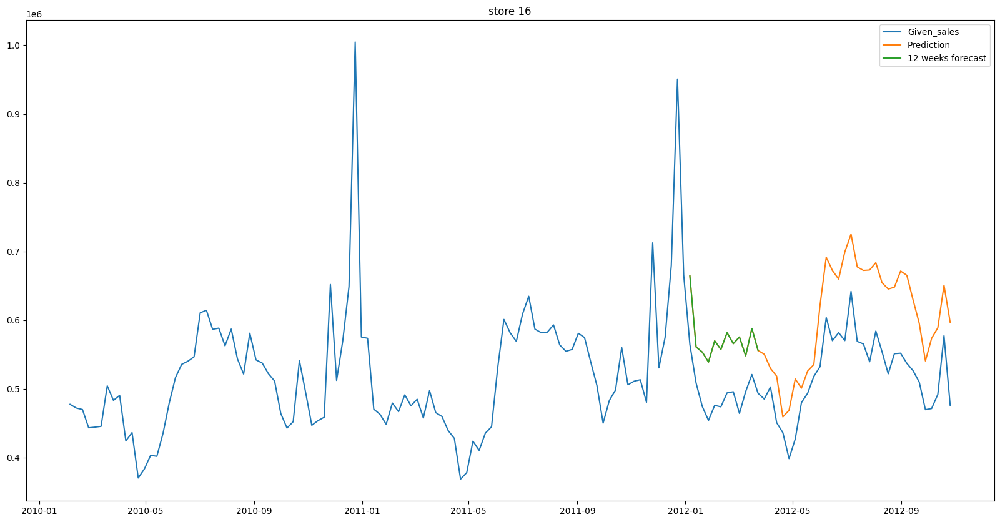

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


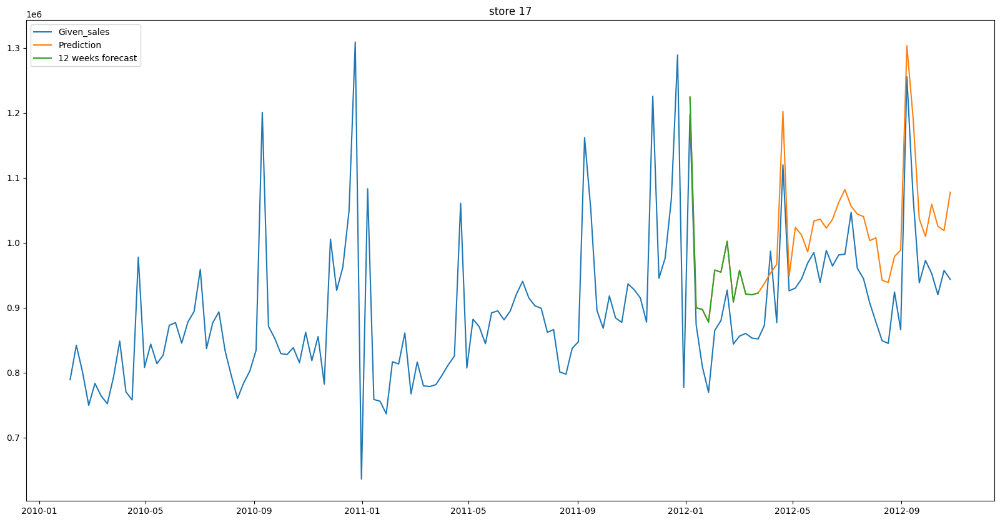

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


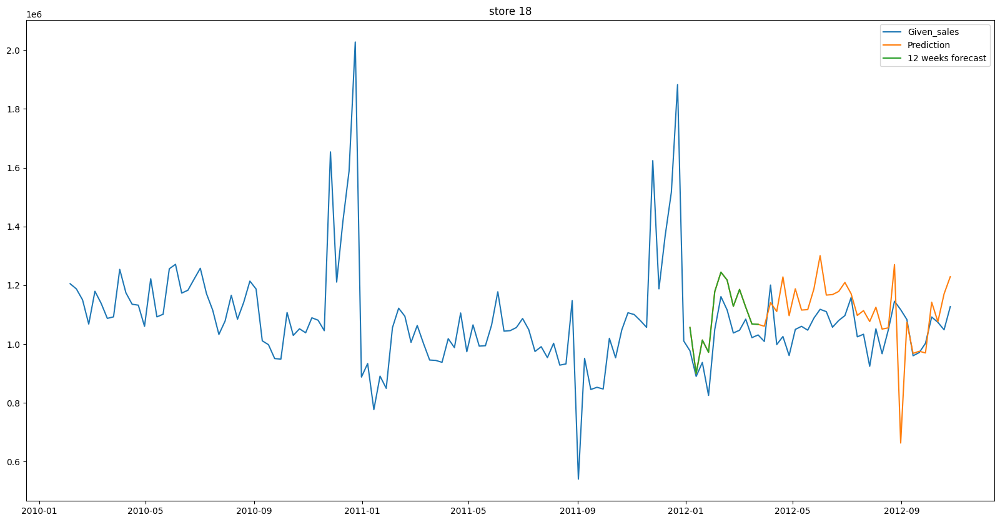

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


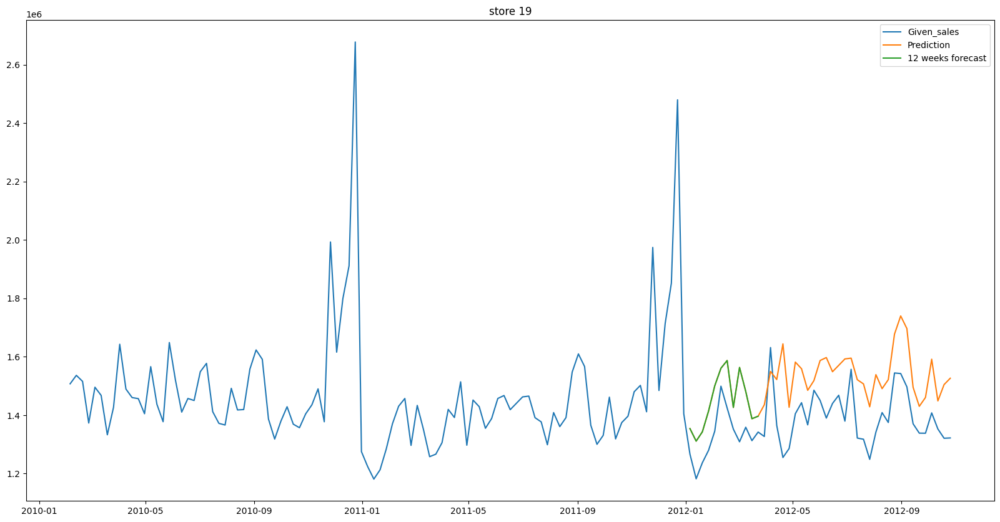

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


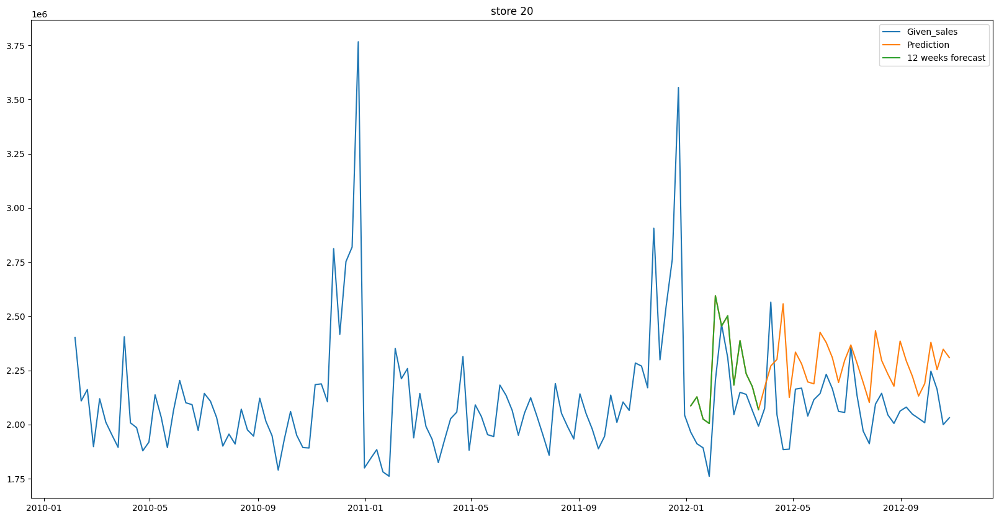

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


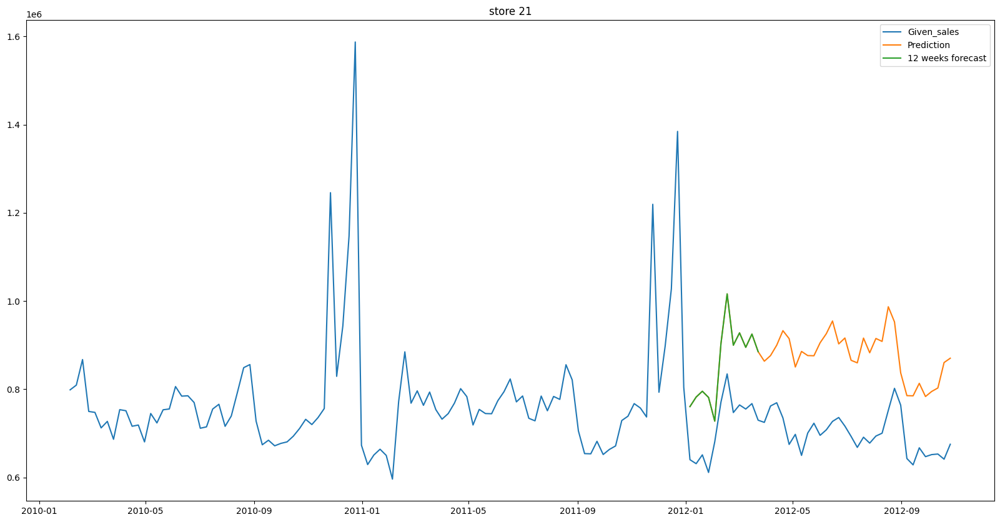

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


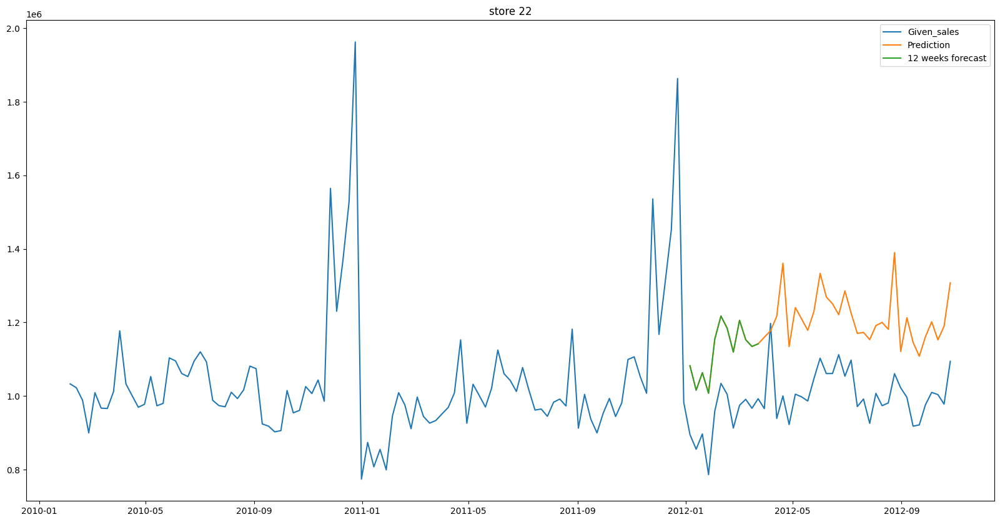

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


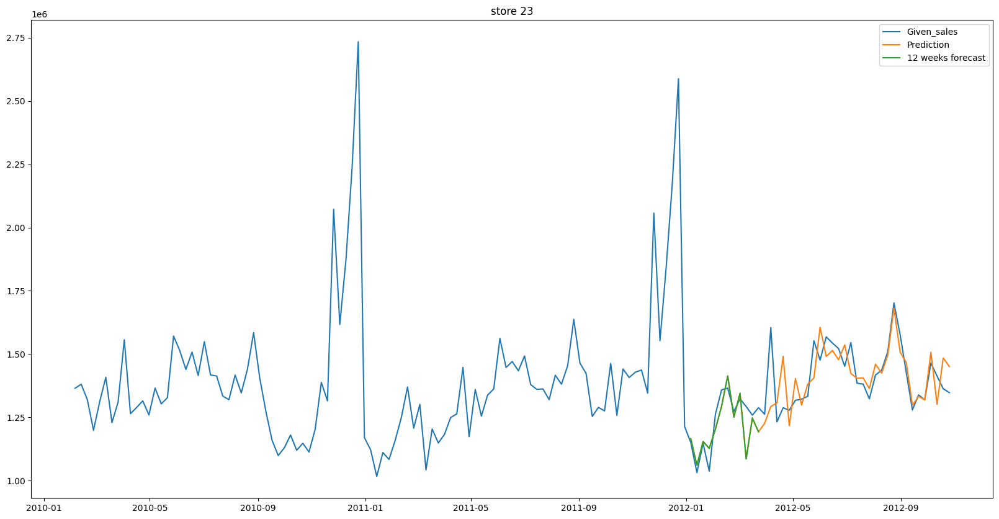

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


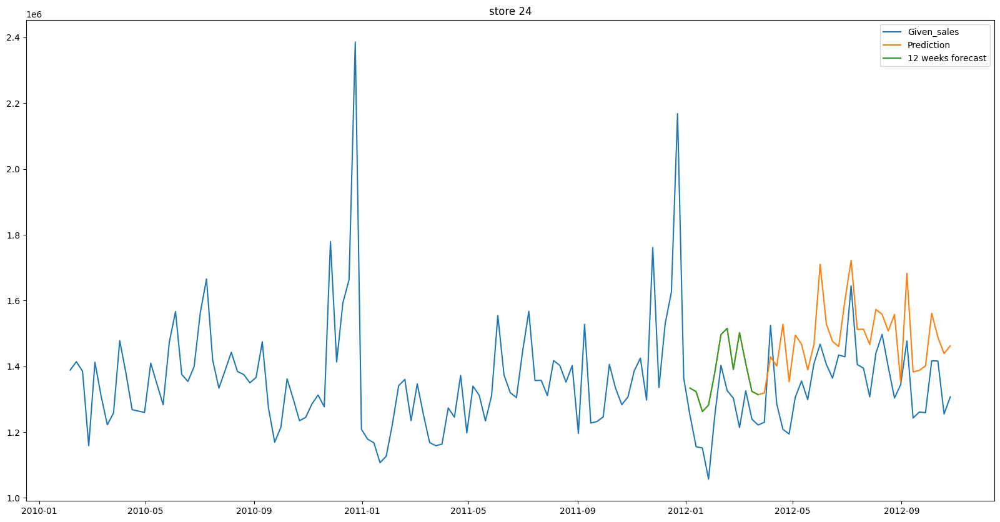

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


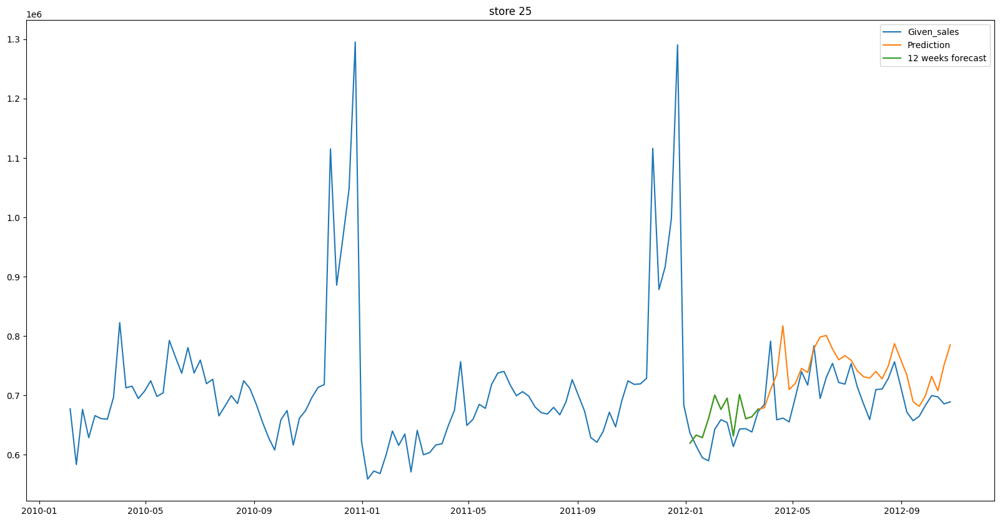

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


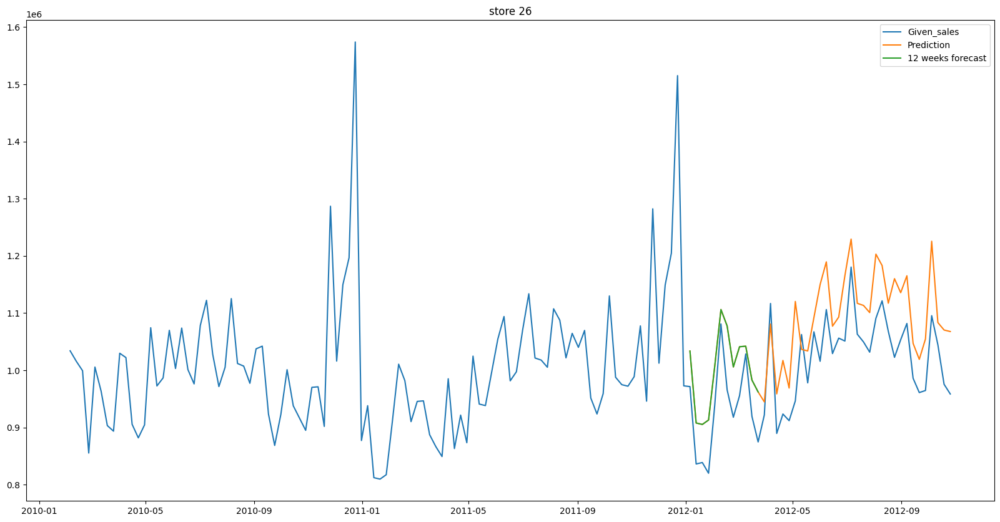

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


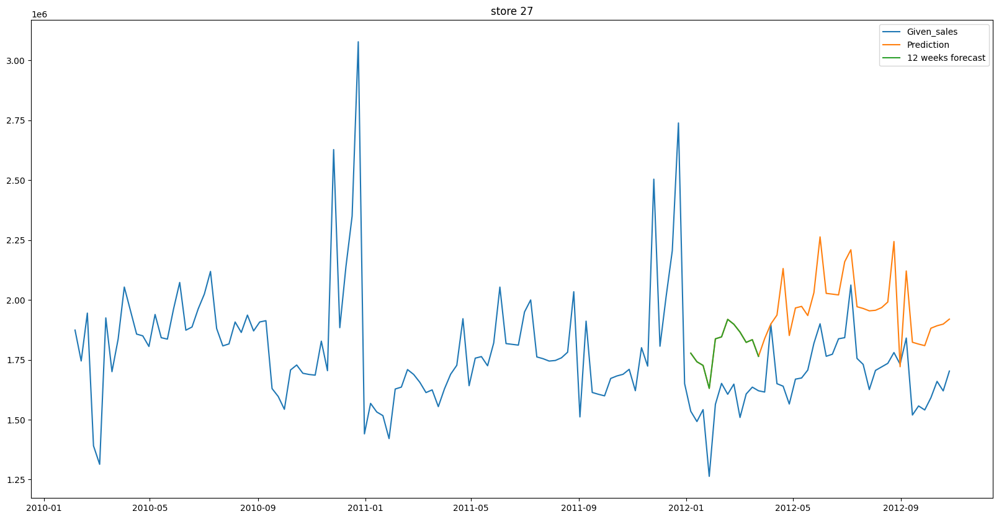

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


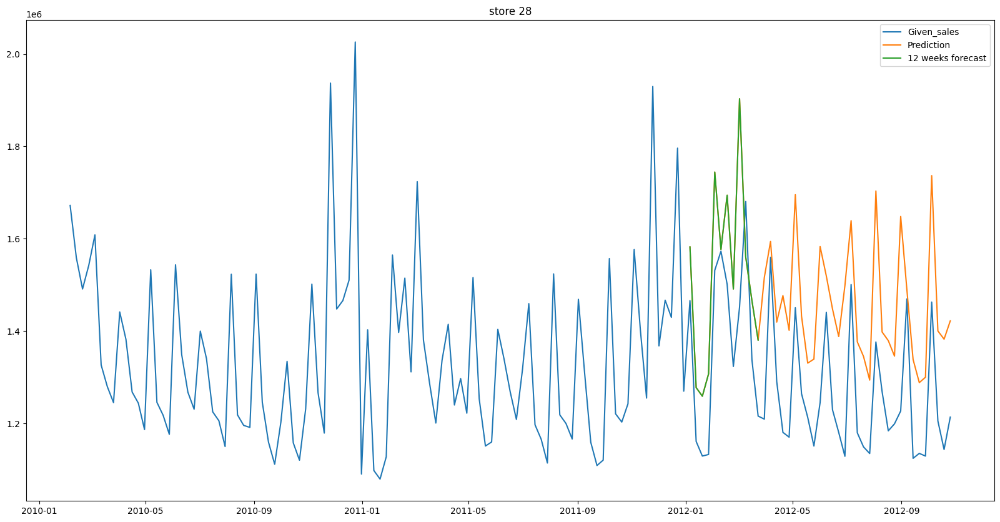

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


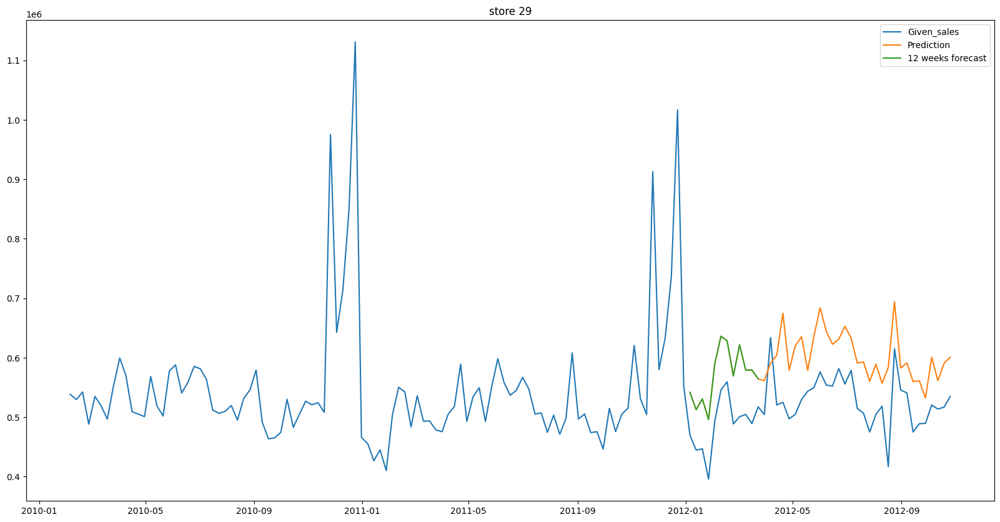

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


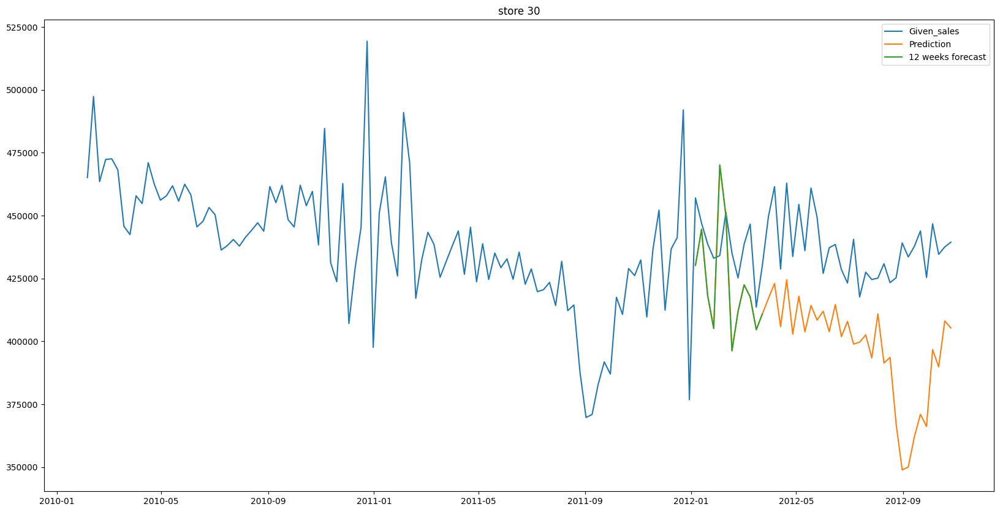

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


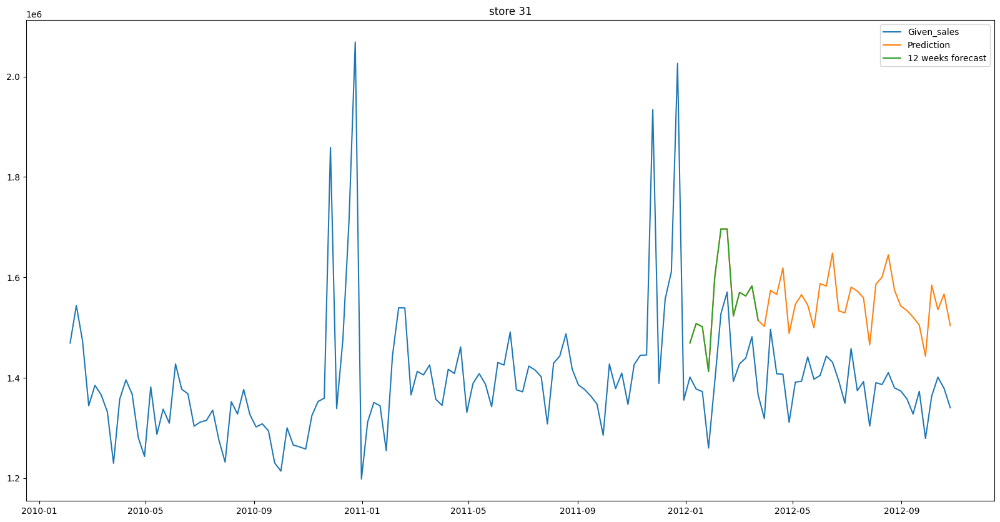

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


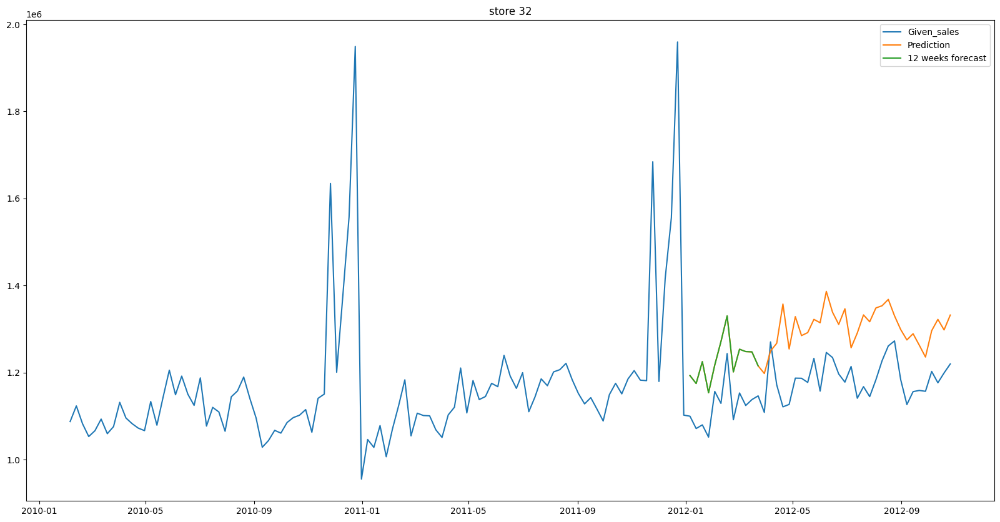

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


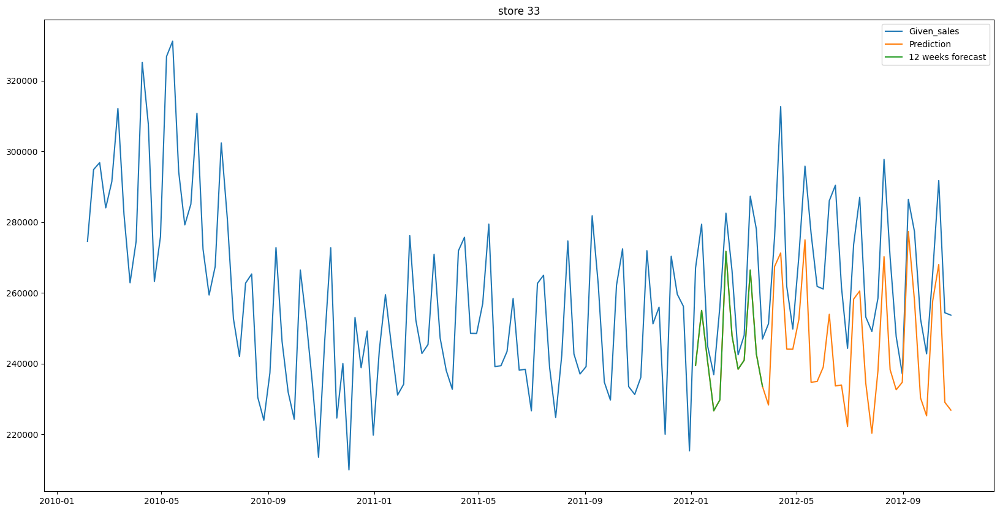

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


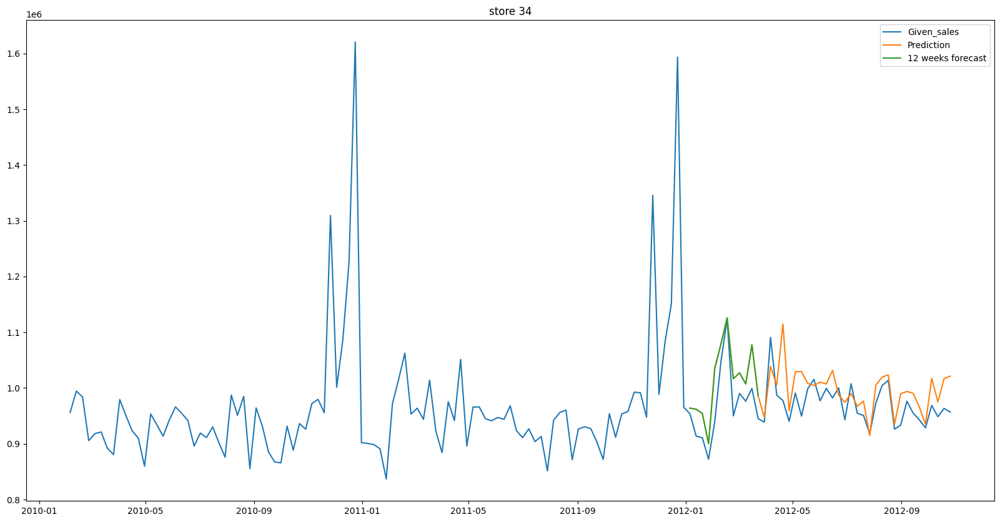

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


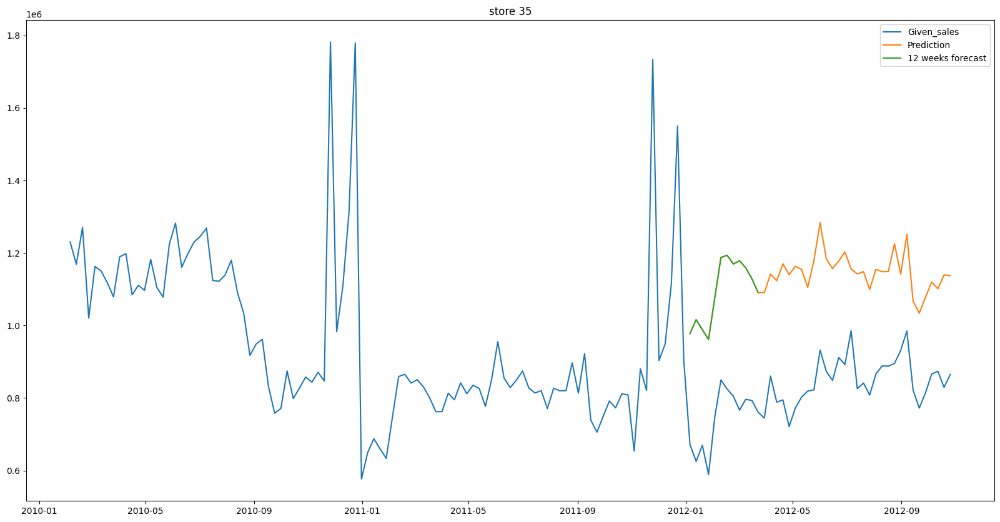

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


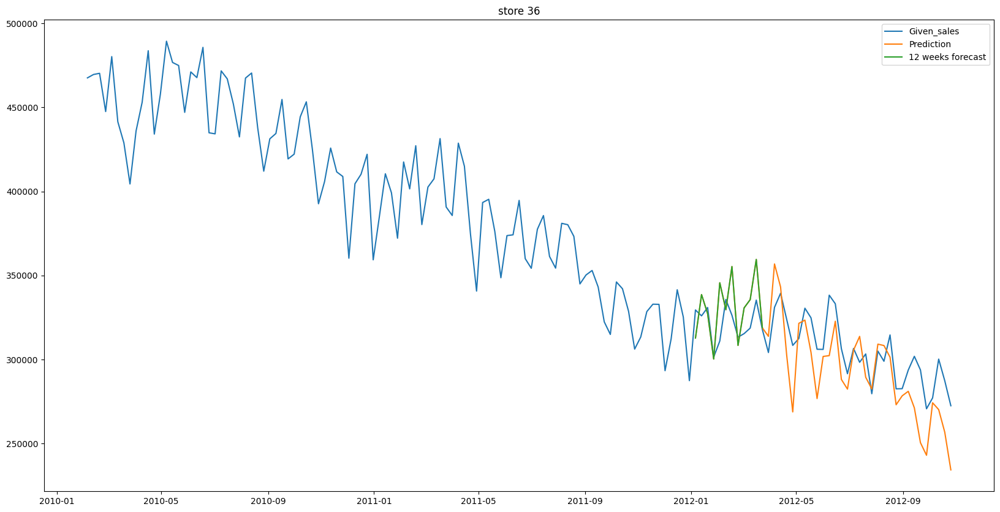

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


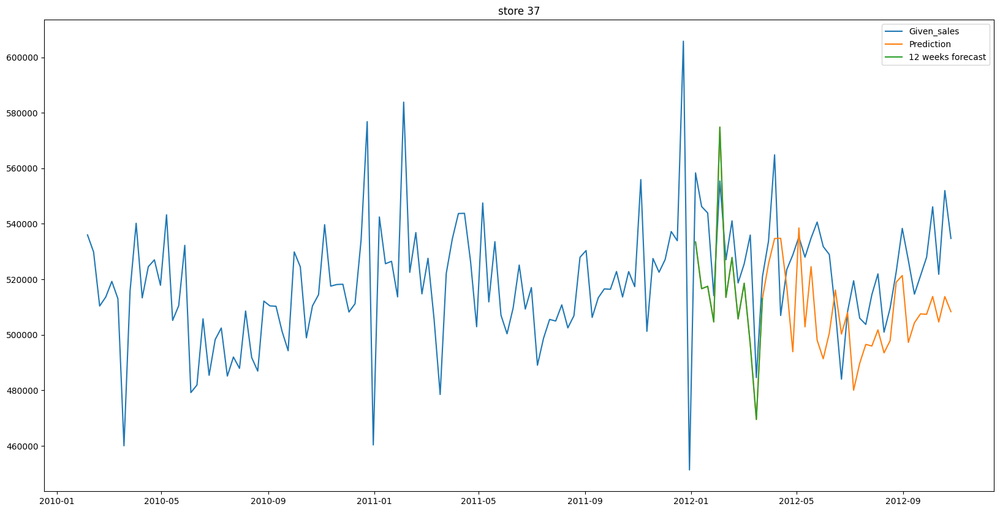

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


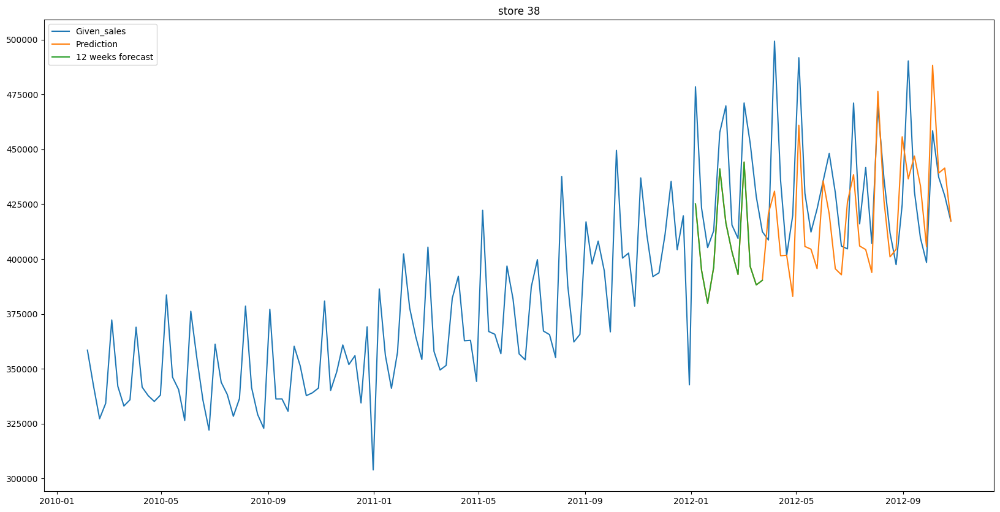

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


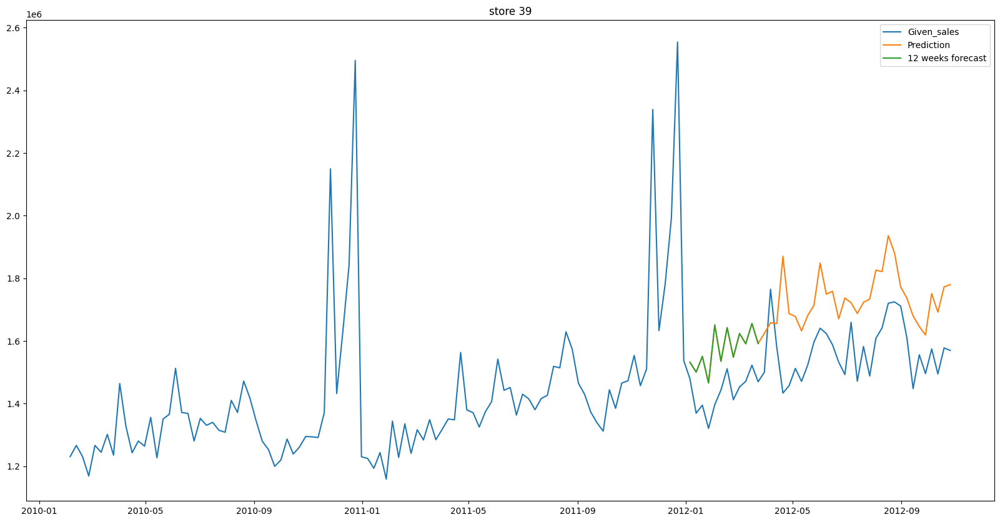

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


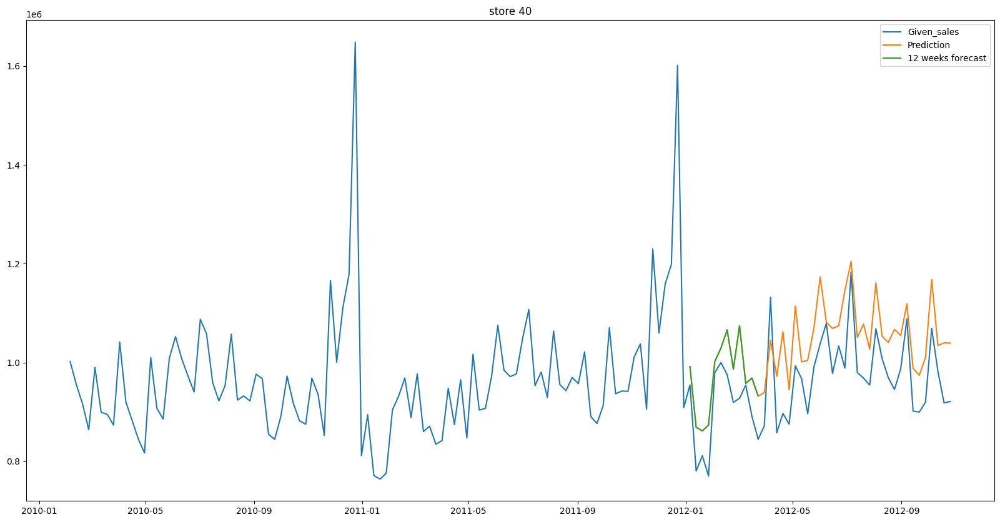

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


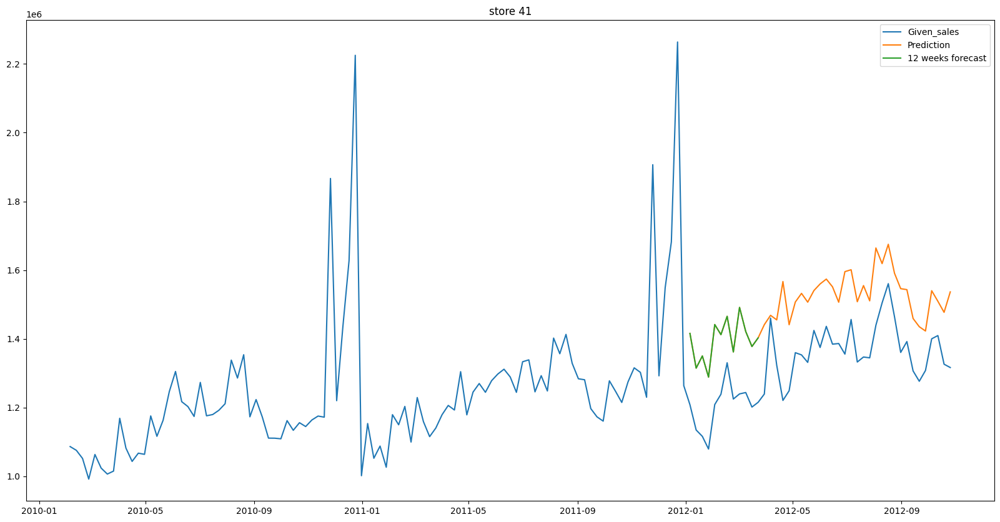

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


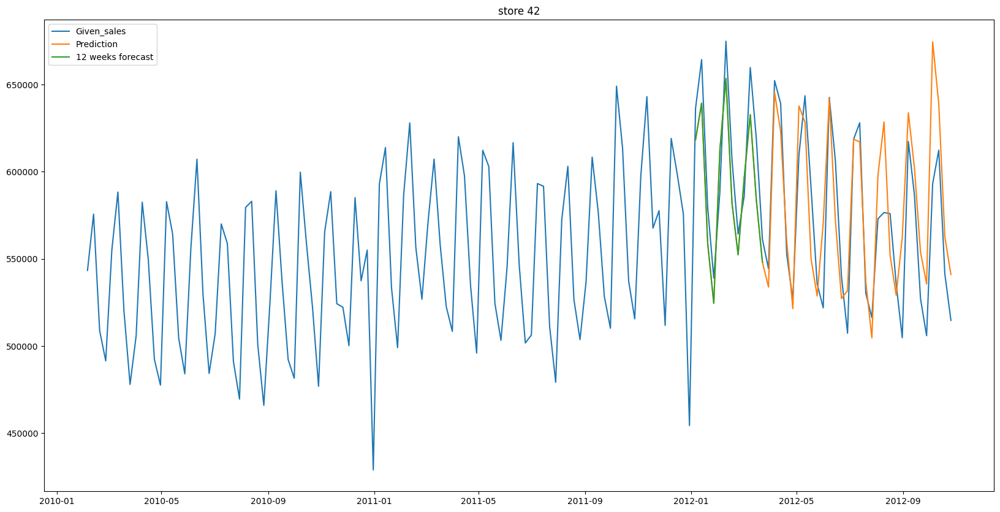

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


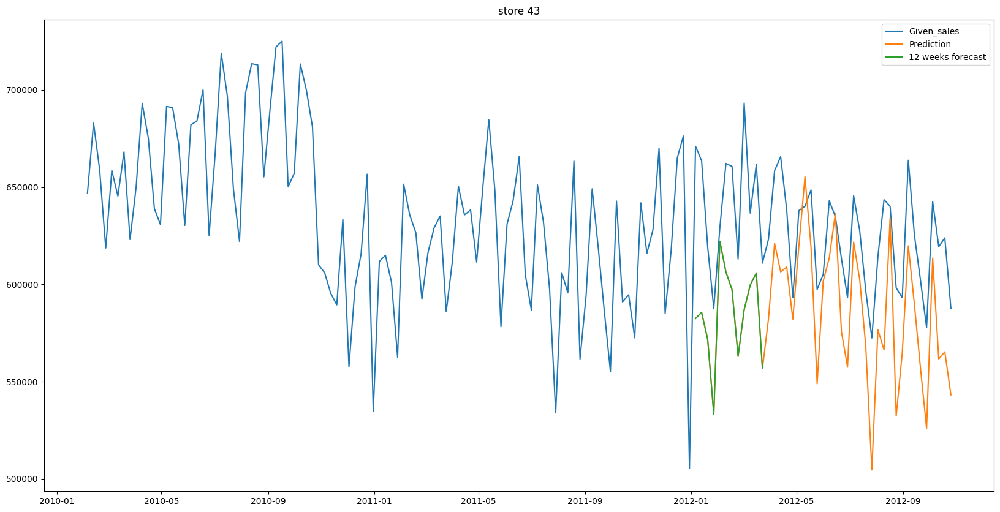

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


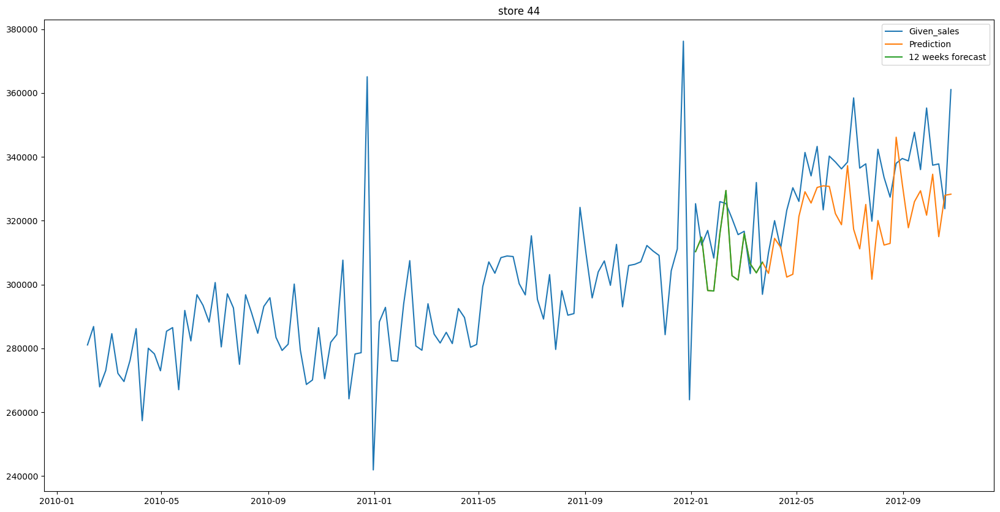

d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
d:\yourenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


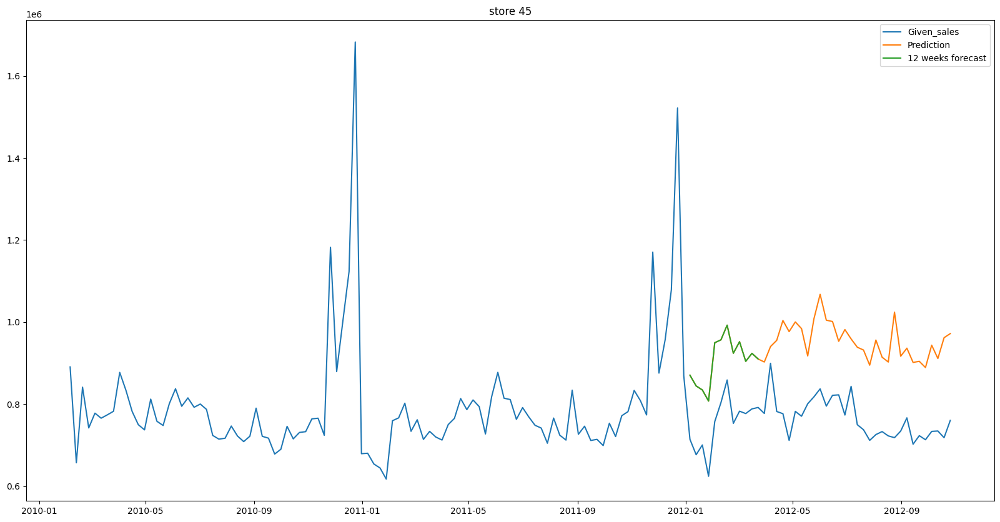

In [84]:
for i in range(1,46):
    new_data=pd.DataFrame(df[df["Store"]==i]["Weekly_Sales"])
    lag52=pd.DataFrame(new_data["Weekly_Sales"].diff(52))
    acf_values,confidence_intervals=sm.tsa.acf(lag52.dropna(),nlags=20,alpha=0.05)
    pacf_values=sm.tsa.pacf(lag52.dropna(),nlags=20)
    significant_acf = []
    significant_pacf = []
    for lag,acf,confident in zip(range(len(acf_values)),acf_values,confidence_intervals):
        if(abs(acf)>confident[1]):
            significant_acf.append(acf)
        else:
            break
    for lag,pacf,confident in zip(range(len(pacf_values)),pacf_values,confidence_intervals):
        if(abs(acf)>confident[1]):
            significant_pacf.append(acf)
        else:
            break
    p=len(significant_acf)
    q=len(significant_pacf)
    train=new_data[:round(len(new_data)*0.7)]
    model=SARIMAX(train,order=(p,1,q),seasonal_order=(p,1,q,52))
    model_fit=model.fit()
    pred=model_fit.predict(start=len(train),end=len(new_data)-1,dynamic=True)
    forecast=model_fit.forecast(steps=12)
    plt.figure(figsize=(20,10))
    plt.plot(new_data['Weekly_Sales'],label='Given_sales')
    plt.plot(pred,label='Prediction')
    plt.plot(forecast,label="12 weeks forecast")
    plt.legend()
    plt.title(f'store {i}')
    plt.show()
    
  
